In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.io
import multiprocessing as mp
from systems import *
import os
import Belousov_Zhabotinsky as BZ
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import utils

In [2]:

N = 5  # Number of variables
F = 8  # Forcing
def L96(x):
    """Lorenz 96 model with constant forcing"""
    # Setting up vector
    d = np.zeros(N)
    # Loops over indices (with operations and Python underflow indexing handling edge cases)
    for i in range(N):
        d[i] = (x[(i + 1) % N] - x[i - 2]) * x[i - 1] - x[i] + F
    return d
def J_L96(x):
    """Lorenz 96 model with constant forcing"""
    # Setting up vector
    J = np.zeros((N,N))
    # Loops over indices (with operations and Python underflow indexing handling edge cases)
    for i in range(N):
        J[i,(i + 1) % N] =  x[i - 1]
        J[i,i] = -1
        J[i,i - 1] = (x[(i + 1) % N] - x[i - 2])
        J[i,i - 2] =  -x[i - 1]
    return J    
def lorentz(x, sigma = 10, rho = 28, beta = 8/3):
    dx = np.zeros((3,))
    dx[0] = sigma * (x[1] - x[0])
    dx[1] = x[0]*(rho - x[2]) - x[1]
    dx[2] = x[0] * x[1] - beta * x[2]
    return dx
def Jlorentz(x, sigma = 10, rho = 28, beta = 8/3):
    J=[[-sigma,    sigma,       0],
       [rho - x[2],     -1,   -x[0]],
       [x[1],           x[0], -beta]]
    return J
def aa(x, sigma = 10, rho = 28, beta = 8/3):
    dx = np.zeros((3,))
    dx[0] =  - x[0]
    dx[1] =  - x[1]
    dx[2] =  - x[2]
    return dx
def Jaa(x, sigma = 10, rho = 28, beta = 8/3):
    J=- np.eye(3)
    return np.array(J)
normalizer = lambda X: (X-X.min())/(X.max()-X.min())


In [3]:
def wtf_diff(x,axis=1):
    s = list(x.shape)
    x = x.reshape([-1,s[axis]])
    s[axis]-=1
    d = np.diff(x)
    return d.reshape(s)
normaleq = lambda X,Y: np.linalg.inv(X.T@X)@(X.T@Y)


In [4]:
def sample_spherical(npoints, ndim=3):
    vec = np.random.randn(ndim, npoints)
    vec /= np.linalg.norm(vec, axis=0)
    return vec

xrange, yrange, zrange = ((-30,30),(-40,40),(0,70))

abc = 2*np.expand_dims(np.array([50,]*N),axis=1)
pnts = sample_spherical(1500,ndim=5)*abc


In [5]:
def plt5(x):
    plt.figure(figsize=[110,110])
    plt.subplot(4,1,1)
    if len(x.shape)==2:
        plt.scatter(x[:,0],x[:,1],c='r')
        plt.ylabel('y')
        plt.subplot(4,1,2)
        plt.scatter(x[:,0],x[:,2],c='r')
        plt.ylabel('z')
        plt.subplot(4,1,3)
        plt.scatter(x[:,0],x[:,3],c='r')
        plt.ylabel('a')
        plt.subplot(4,1,4)
        plt.scatter(x[:,0],x[:,4],c='r')
    else:
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,1])
        plt.ylabel('y')
        plt.subplot(4,1,2)
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,2])
        plt.ylabel('z')
        plt.subplot(4,1,3)
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,3])
        plt.ylabel('a')
        plt.subplot(4,1,4)
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,4])
    plt.ylabel('b')
    plt.xlabel('x')
    plt.show()
def plt3(x):
    plt.figure(figsize=[110,110])
    plt.subplot(2,1,1)
    if len(x.shape)==2:
        plt.scatter(x[:,0],x[:,1],c='r')
        plt.ylabel('y')
        plt.subplot(2,1,2)
        plt.scatter(x[:,0],x[:,2],c='r')
    else:
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,1])
        plt.ylabel('y')
        plt.subplot(2,1,2)
        for n in range(x.shape[1]):
            plt.scatter(x[:,n,0],x[:,n,2])
    plt.ylabel('z')
    plt.xlabel('x')
    plt.show()

def pltN(x):
    N = x.shape[-1]
    plt.figure(figsize=[110,110])
    if len(x.shape)==2:
        print(N)
        for q in range(N-1):
            plt.subplot(N-1,q+1,1)
            print(((N,q+1,1)))
            plt.scatter(x[:,0],x[:,q+1],c='r')
    else:
        for q in range(N-1):
            for n in range(x.shape[1]):
                plt.subplot(N,q+1,1)
                plt.scatter(x[:,n,0],x[:,n,q+1])
    plt.show()


In [6]:
def step(states):
    oldstates = np.copy(states)
    for j in range(substeps):
        states = rk_iter_nophi(dt,f,Jf,states)
    return states, oldstates[0]-states[0]
def rk_iter_nophi(dt,f,Df,states):
    for i in range(len(states)):
        state = states[i]
        k1=dt*f(state)
        k2=dt*f(state+k1/2)
        k3=dt*f(state+k2/2)
        k4=dt*f(state+k3)
        states[i]=state+k1/6+k2/3+k3/3+k4/6
    return states


T = 100
DT=0.001
N = 5  # Number of variables
substeps=1
num = 200
spread = 1
f = L96
Jf = J_L96
states = spread*np.random.randn(num,N)+pnts[:N,0]



#initializing variables
dt = DT/substeps
X = np.zeros((T,num,N))
RX = np.zeros((T,num,N))
#JX = np.zeros((T,num,N,N))
rotation_manager = utils.rot_keeper(d=N)
allRots = np.zeros((T,N,N))
allG = np.zeros((T,N-1,N-1))
allOmega = np.zeros((T,N))

for i in range(T):
    states, ds = step(states)
    X[i] = states
    allRots[i] = rotation_manager.get_rot(ds)
    RX[i] = (allRots[i]@(states-states[0]).T).T
    #JX[i] = np.stack([allRots[i].T@Jf(s)@allRots[i] for s in states],axis=0)
    #RX[i] = (allRots[i]@(states-states[0]).T).T
    
    #allOmega[i,:] = Phi[0,:]#/np.sqrt(np.sum(ds**2))
    #G = Phi[1:,1:]

    #allG[i,:,:] = G

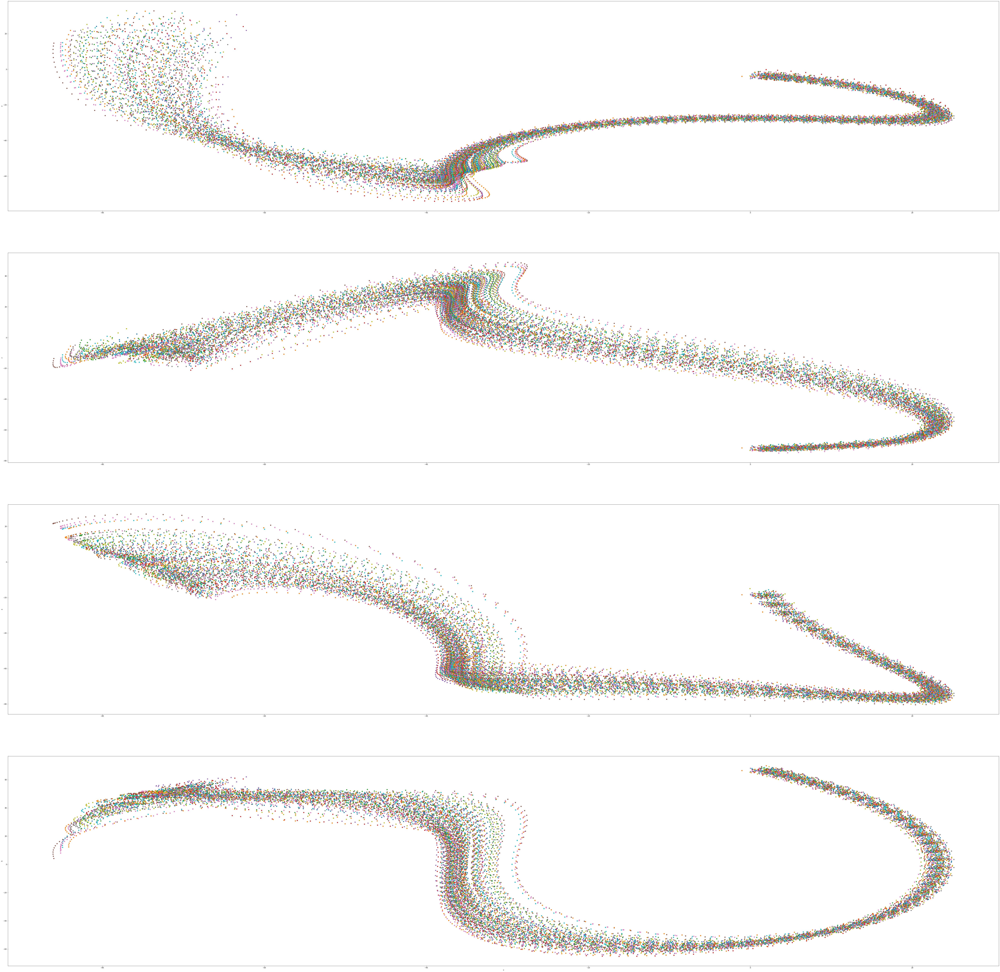

In [7]:
X = np.array(X)
plt5(X)

In [24]:
np.minimum([1,2,3,4],2)

array([1, 2, 2, 2])

In [20]:
these_points.shape

NameError: name 'these_points' is not defined

In [36]:
def local_linear(points,l_frame=5,verify=False,rot=True):
    points = X
    rot_man = utils.rot_keeper(d=N)

    frame_centers = points[l_frame//2::l_frame,0,:]
    dss = -points[l_frame//2::l_frame,0,:]+points[l_frame//2+1::l_frame,0,:]
    numframes = len(frame_centers)
    frame_assignment = np.argmin(np.sum((np.expand_dims(np.expand_dims(frame_centers,1),1)-np.expand_dims(points[:-1,1:,:],0))**2,axis=3),axis=0)
    for q in range(numframes):
        times,instances = np.where(frame_assignment==q)
        R = rotation_manager.get_rot(dss[q])
        these_pnts = X[times,instances,:] - frame_centers[q]
        if rot: these_pnts = (R @ these_pnts.T).T
        these_dpnts = X[times+1,instances,:]-X[times,instances,:]
        if rot: these_dpnts = (R @ these_dpnts.T).T
        A = normaleq(these_pnts,these_dpnts)
        v,e = np.linalg.eig(A)
        plt.figure()
        plt.scatter(np.real(v),np.imag(v))
        plt.show()
        if verify:
            n = 9 if len(these_pnts) > 9 else -1
            print(f"percent error {100*(these_dpnts[n,:]-these_pnts[n,:]@A)/these_dpnts[n,:]}")
            print(f"this {these_pnts[n,:]@A}")
            print(f"orig {these_dpnts[n,:]}")
            plt.figure()
            plt.scatter(these_pnts[:,1],these_pnts[:,2],c=normalizer(these_dpnts[:,:3]))
            plt.show()

array([  2.35200718,  -4.19484395, -72.20902232, -23.35207616,
        65.96226593])

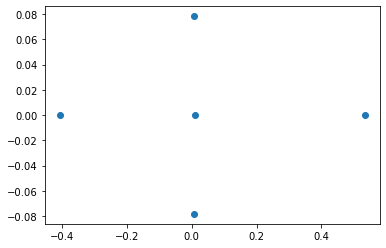

percent error [26.87396792  1.3758225  -6.13332468  0.96227832  2.96533132]
this [ 3.96675358 -0.33285237 -0.05545078 -0.22486234 -0.09864404]
orig [ 5.42454372 -0.33749572 -0.05224634 -0.22704717 -0.10165855]


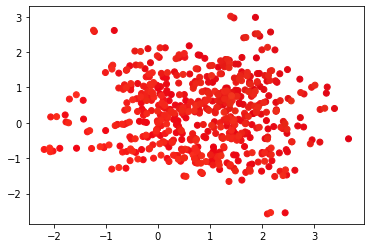

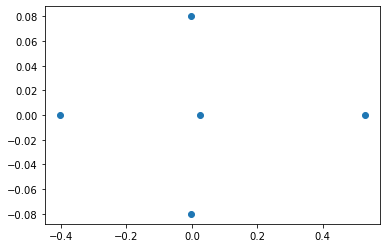

percent error [ 7.06022737  1.53997231 -1.02010426 -2.17458057 75.65784773]
this [ 5.34423742e+00 -2.17922610e-01 -7.61300730e-02 -8.59544750e-02
  1.12258019e-03]
orig [ 5.75021573e+00 -2.21331047e-01 -7.53613091e-02 -8.41251068e-02
  4.61167187e-03]


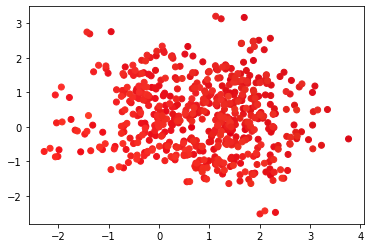

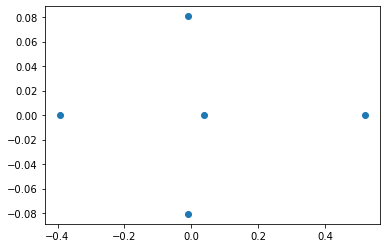

percent error [ 3.67726157  0.95903934 -4.86007936 24.87822583 10.70991284]
this [ 6.00818354 -0.60479197 -0.25311929 -0.03803798 -0.17555067]
orig [ 6.23755475 -0.61064833 -0.24138766 -0.05063509 -0.19660712]


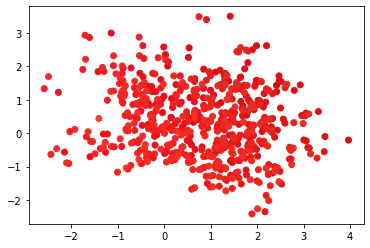

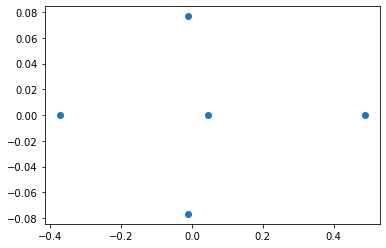

percent error [ -1.49491229  -0.56955789  -4.77785105 -10.73031482  55.45596693]
this [ 6.53653185 -0.77588892 -0.47627708  0.12648728 -0.02346432]
orig [ 6.44025568 -0.77149481 -0.45455893  0.11423004 -0.05267667]


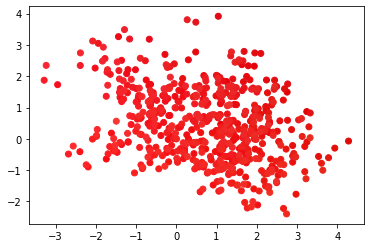

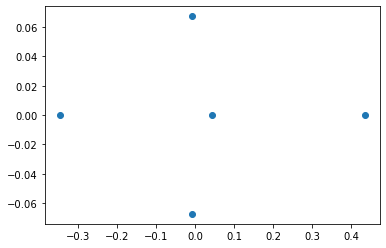

percent error [ -12.89461452    3.88290185   -2.38210366 -142.47008254  -17.02606495]
this [ 7.61208773 -0.70302562 -0.6254026   0.01283338  0.16036695]
orig [ 6.74264912e+00 -7.31426176e-01 -6.10851483e-01  5.29276829e-03
  1.37035244e-01]


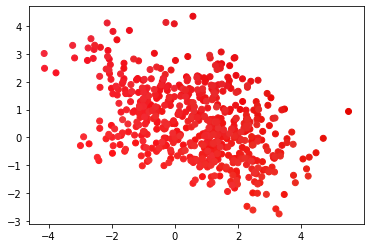

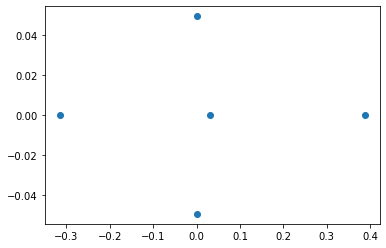

percent error [  7.99373288   2.16297562  -0.92106736 -52.93380597  -1.07533924]
this [ 6.22648931 -0.73607805 -0.38382784  0.06882279  0.2410364 ]
orig [ 6.76746216 -0.75235122 -0.38032479  0.04500168  0.23847202]


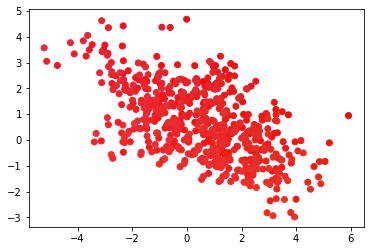

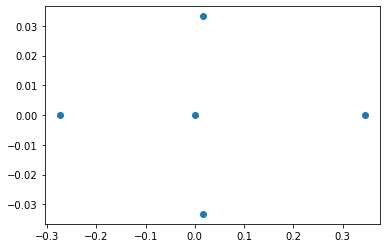

percent error [   7.16298507    2.70741382   -1.81956978 -105.56875471    1.91301974]
this [ 5.88034116 -0.67501987 -0.37613421  0.0483656   0.30921406]
orig [ 6.33404808 -0.69380401 -0.36941249  0.0235277   0.31524475]


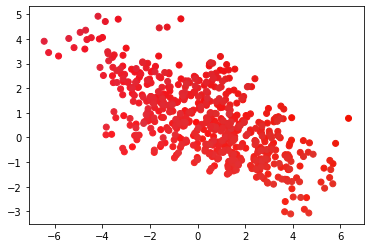

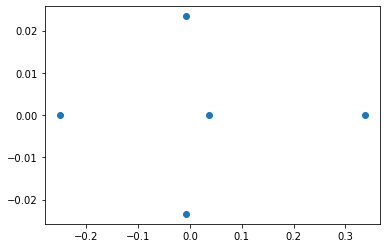

percent error [ 12.04265283   4.11839022  -0.60002616 316.0302837    2.34057739]
this [ 5.01240244 -0.55672384 -0.40301857  0.01311452  0.32571702]
orig [ 5.69867396 -0.58063673 -0.40061478 -0.00607069  0.33352339]


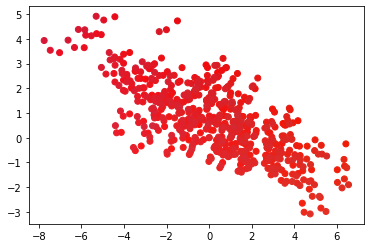

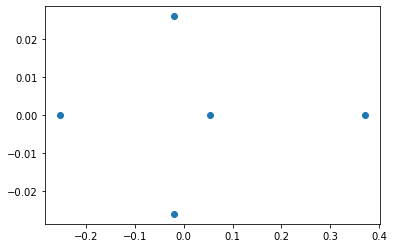

percent error [ -2.88794743   1.91566085  -0.99630538 -35.32710604   5.75684391]
this [ 5.03607693 -0.4792437  -0.44758924  0.07363964  0.30945186]
orig [ 4.89471999 -0.48860369 -0.44317387  0.05441603  0.32835472]


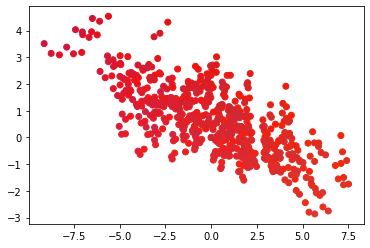

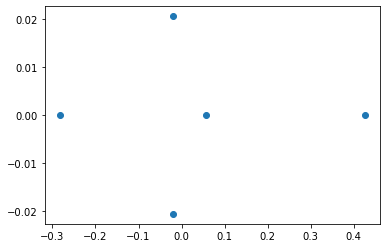

percent error [-8.78887712  0.48230265  1.88335511 -9.28138674 10.15108577]
this [ 4.51162132 -0.36828018 -0.50660828  0.16505361  0.16853728]
orig [ 4.14713474 -0.37006501 -0.51633265  0.15103542  0.18757853]


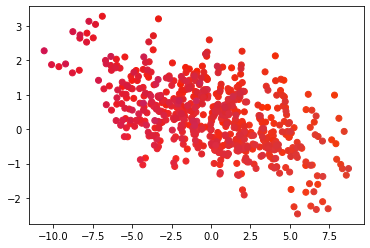

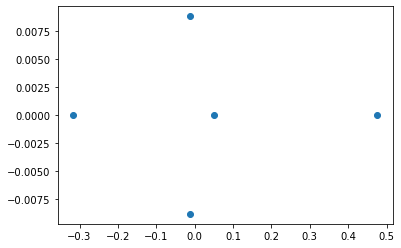

percent error [  50.0299426    -9.14206189   -0.44465027 -161.1294876    -0.57347209]
this [ 1.77915783  0.15348075 -0.59985154  0.04043941 -0.41808764]
orig [ 3.56044784  0.14062475 -0.5971961   0.01548635 -0.41570369]


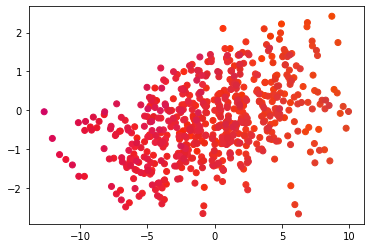

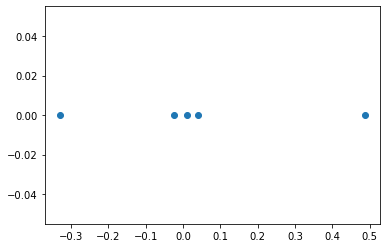

percent error [ 41.5339034    3.05688633 -77.50002873 -15.75965439  -2.56770138]
this [ 1.78697729  0.38929605  0.06692562  0.23786284 -0.98642797]
orig [ 3.05643338  0.40157163  0.03770457  0.20547991 -0.96173352]


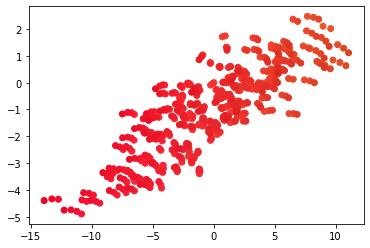

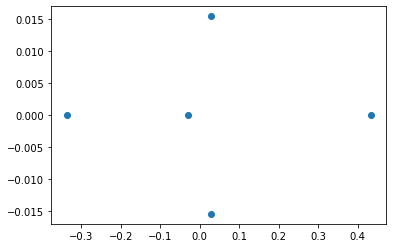

percent error [-13.99727049   7.86401941  -8.09338941 -17.08036678  -2.02153688]
this [ 2.98707714  0.4436759   0.67586502 -0.10111582 -0.70618199]
orig [ 2.62030584  0.48154467  0.62526027 -0.08636446 -0.69218913]


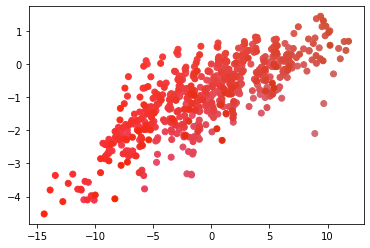

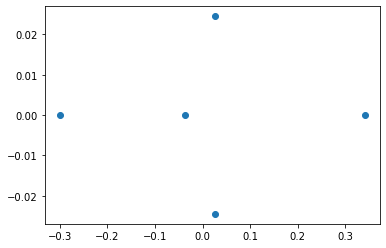

percent error [-21.78819743  10.08805255  -2.36870743  -0.40362356   2.75317733]
this [ 3.04487738  0.45251601  0.97874091 -0.40370657 -0.40302081]
orig [ 2.5001416   0.50328796  0.95609385 -0.40208367 -0.41443082]


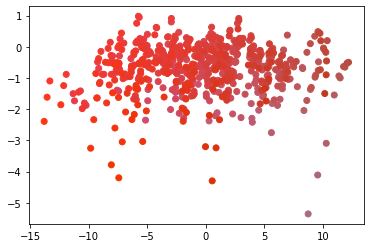

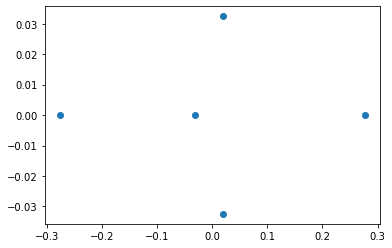

percent error [102.79162816  11.16208888  -1.04294135  -2.11099749  30.92356286]
this [-0.07926141  0.29407272  0.76631645 -0.51305668 -0.07971405]
orig [ 2.83925387  0.33102165  0.75840671 -0.50244997 -0.11539977]


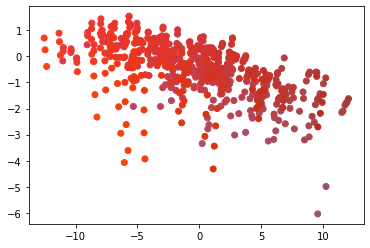

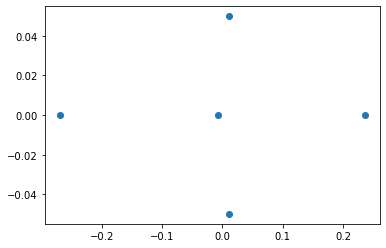

percent error [-2.49633334 52.63543448 -0.69373908 -8.3998775  30.70325947]
this [ 2.60492142  0.13816291  0.70102235 -0.8107779  -0.14584334]
orig [ 2.54147766  0.29170099  0.69619259 -0.74795094 -0.21046204]


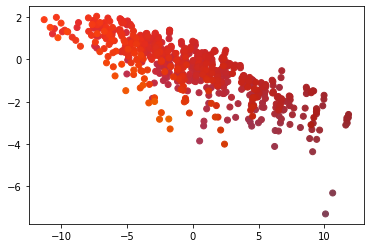

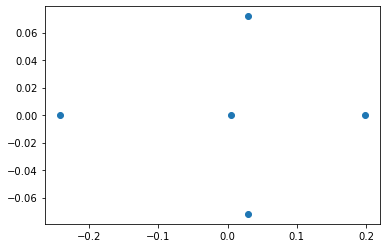

percent error [-54.3708838  122.35107414   6.33434369   4.63640518  16.12260311]
this [ 4.46122496 -0.00844812  0.59707882 -0.68892366  0.03395658]
orig [ 2.88993938  0.03779737  0.63745757 -0.72241788  0.04048359]


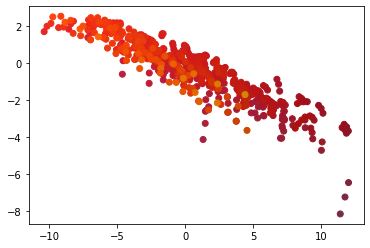

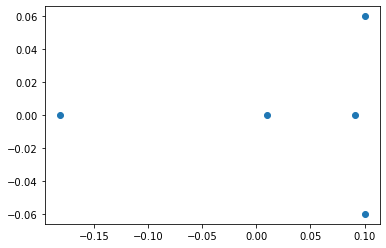

percent error [ -16.14060005 -101.45340089    6.71575458   -1.64554908 -535.74401672]
this [ 3.25472693 -0.40088686  0.49508664 -0.92588832  0.07957464]
orig [ 2.80240237 -0.19899731  0.53072911 -0.91089903  0.01251677]


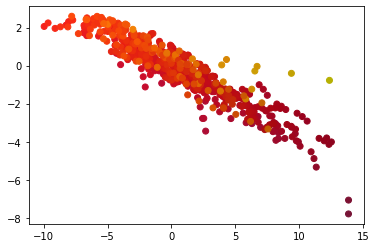

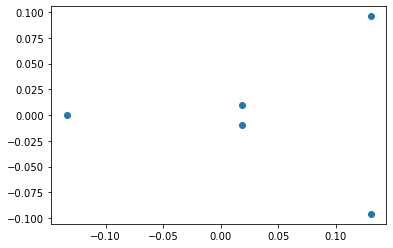

percent error [-24.82337841 -22.15960891  17.82163784  11.40642626  34.79304227]
this [ 4.036733   -0.61336324  0.41084453 -0.67888463  0.19215052]
orig [ 3.23395589 -0.50209987  0.49994247 -0.76629105  0.29467794]


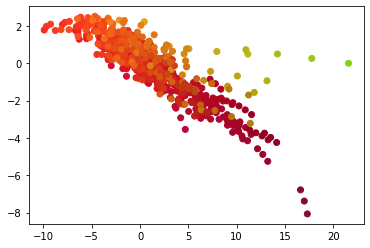

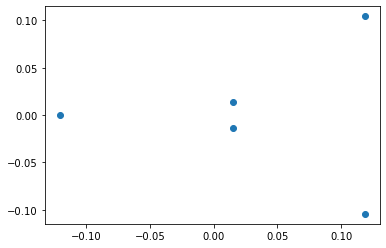

percent error [ 39.16228584 -12.42182461  20.98020875  16.93428674  31.02740471]
this [ 2.25113017 -0.91274531  0.29858751 -0.44021922  0.29723132]
orig [ 3.70022149 -0.81189334  0.37786421 -0.52996501  0.43094119]


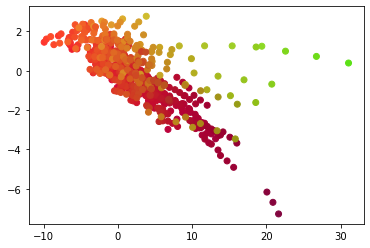

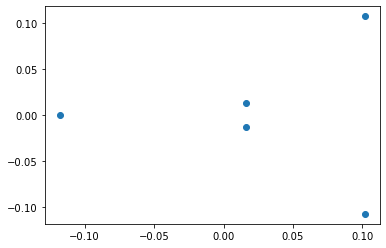

percent error [ 39.71533335   9.50344791 -27.19922215 -28.40605501 139.98672439]
this [ 2.77384244 -0.67690316  0.30186151 -0.10338571 -0.06562556]
orig [ 4.60124041 -0.74798779  0.23731396 -0.08051467  0.16411838]


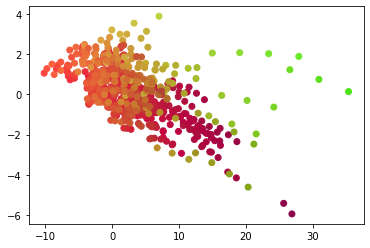

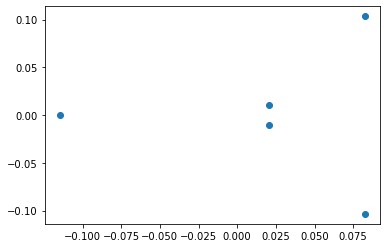

percent error [ 6.25265113 -5.93789357 -1.7519449  38.85830568 48.10506082]
this [ 3.39239799 -1.83248225  0.33757676 -0.09861655  0.22688185]
orig [ 3.61866019 -1.72977033  0.33176443 -0.16129181  0.43719455]


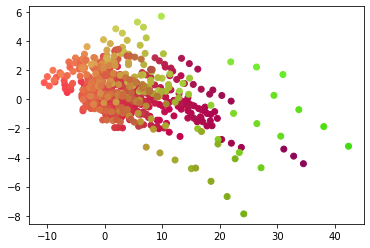

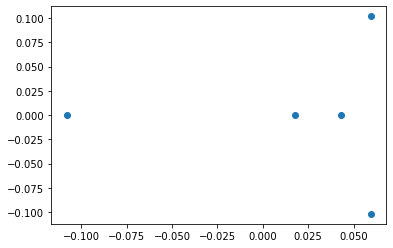

percent error [  -1.73584954   -6.25263359   -8.72178072 -126.69116146  140.48475617]
this [ 3.28916064 -2.25680286  0.33055249  0.12417853 -0.06924208]
orig [ 3.23303993 -2.12399711  0.30403521  0.05477873  0.17103247]


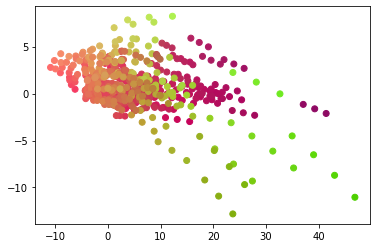

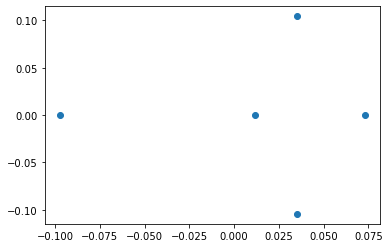

percent error [   9.5597069    -4.60620348  -28.43485748  -13.71575682 -153.699163  ]
this [ 2.68734199 -2.54418594  0.62820803  0.11649247 -0.44345782]
orig [ 2.97139903 -2.43215589  0.4891258   0.1024418  -0.17479672]


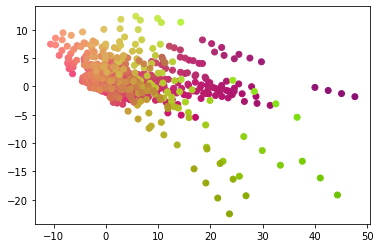

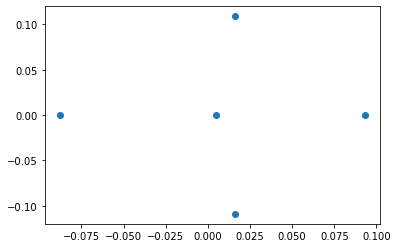

percent error [  73.45051403    5.0587578    -6.68824647 -110.69848467  136.56774523]
this [ 0.99526165 -1.63861778  1.23709153  0.06139719  0.03437931]
orig [ 3.74870404 -1.72592832  1.15953872  0.02913983 -0.0940154 ]


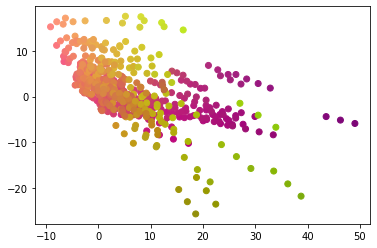

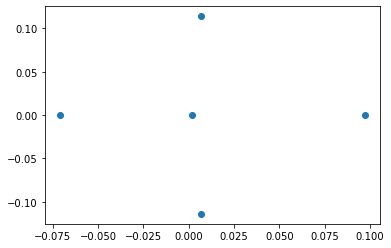

percent error [-1304.09497247   -17.83306239   -69.11016094     8.18406102
   202.39560825]
this [ 7.89688494 -3.24297816  1.55295567  0.59158185 -0.14215113]
orig [ 0.56241815 -2.75218015  0.91831009  0.6443128   0.13882542]


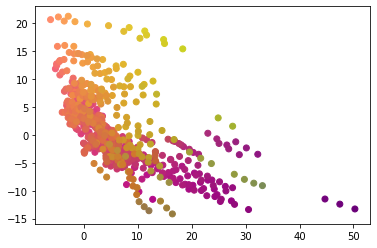

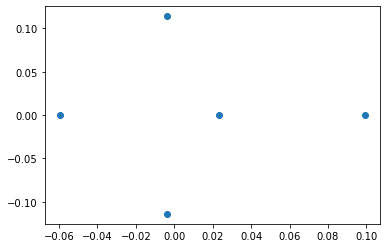

percent error [100.37249389   2.14234009   3.12373986  -7.01751871  10.0057844 ]
this [-0.0110706  -1.60535916  0.71446829  1.55479477  0.46088502]
orig [ 2.97202158 -1.64050434  0.73750606  1.45284136  0.51212739]


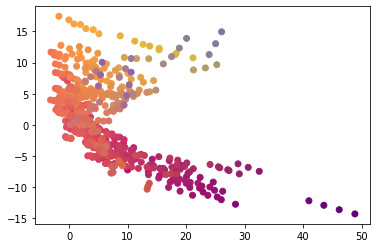

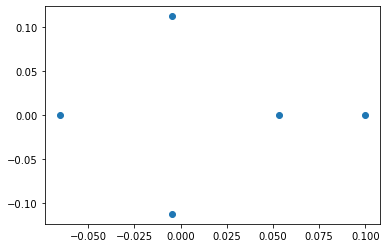

percent error [88.35993594  9.22119262 -7.13703609  8.4492577  20.8118658 ]
this [ 0.45520723 -0.37437532 -0.79373985  1.42754665  0.34179681]
orig [ 3.9106935  -0.41240388 -0.74086411  1.55929555  0.4316263 ]


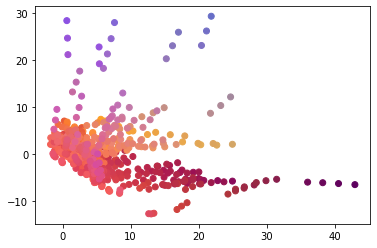

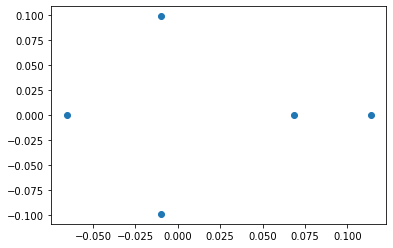

percent error [-1296.09320586   -10.07357221   -92.66629915   -28.75083495
   -31.43038981]
this [ 6.55015612 -2.21913536 -0.89617626  2.40786728 -0.33111224]
orig [ 0.46917757 -2.01604737 -0.46514427  1.87017605 -0.25192974]


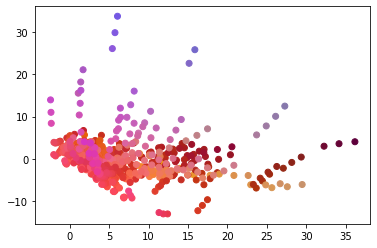

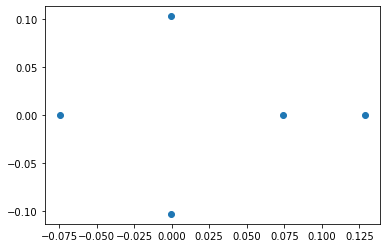

percent error [83.36153861 16.61572674 11.47898256 14.78308848  1.63067549]
this [ 0.63919229 -0.02657485 -1.69594971  0.56458734 -0.5348961 ]
orig [ 3.84165506 -0.03187034 -1.91587237  0.66252969 -0.54376311]


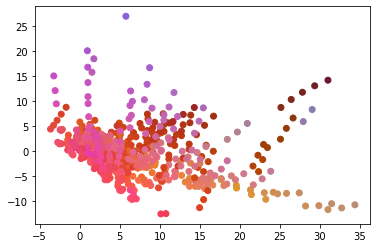

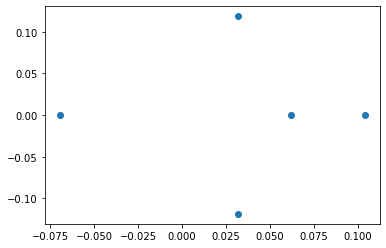

percent error [90.13383112  5.57570824 13.29080155 48.36654613  3.85176036]
this [ 0.40460641  0.13306851 -1.51192583 -0.04573542 -0.77588019]
orig [ 4.10094749  0.14092614 -1.74367409 -0.08857711 -0.80696245]


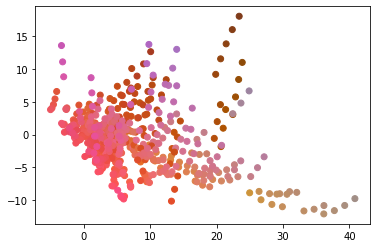

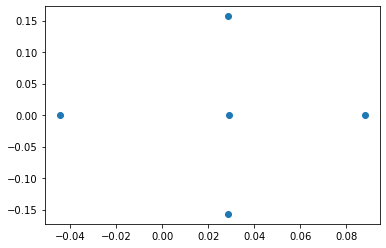

percent error [107.66150018   9.26836232   6.37539368   2.58391801   5.57090094]
this [-0.33304821  0.07274277 -0.85768779 -0.1840957  -0.70177482]
orig [ 4.34703649  0.08017355 -0.91609228 -0.18897875 -0.74317645]


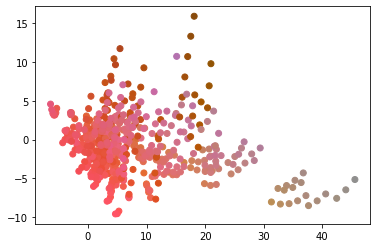

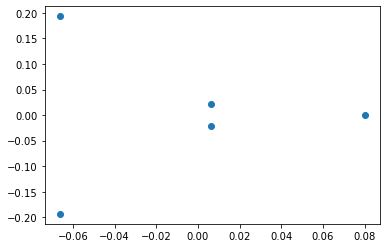

percent error [ 2.15350776  6.92247162  3.74431319 -4.06314446 -1.78014889]
this [ 3.9444544  -0.30274058 -1.67336267 -0.83517739 -1.53899483]
orig [ 4.03126807 -0.32525636 -1.73845591 -0.8025679  -1.5120776 ]


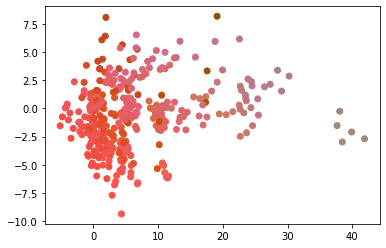

In [58]:
local_linear(points,l_frame=3,verify=True,rot=True)

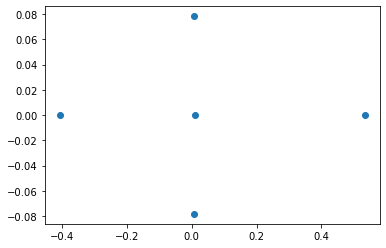

percent error [26.87396792  1.36506378 -6.65087179  0.92126265  2.86470334]
this [ 3.96675358 -0.34107171 -0.05238994 -0.21191254 -0.10088444]
orig [ 5.42454372 -0.34579199 -0.04912285 -0.21388296 -0.10385971]


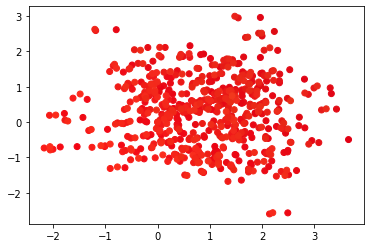

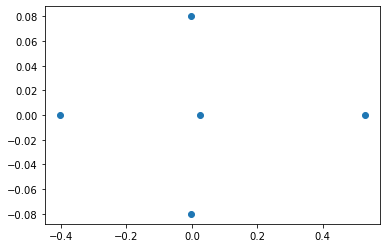

percent error [ 7.06022737  1.46556205 -1.06146183 -2.28697224 67.95879659]
this [ 5.34423742e+00 -2.20794338e-01 -7.47236645e-02 -7.96165363e-02
  1.71033340e-03]
orig [ 5.75021573e+00 -2.24078345e-01 -7.39388320e-02 -7.78364385e-02
  5.33791873e-03]


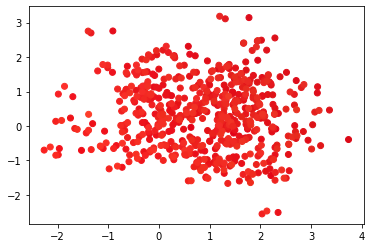

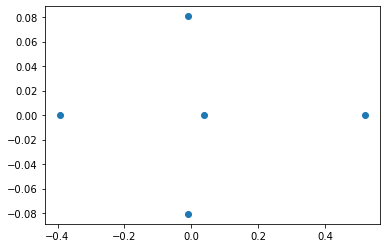

percent error [ 3.67726157  1.05955357 -4.99672465 46.65763891 11.47778415]
this [ 6.00818354 -0.61108722 -0.24777869 -0.01335226 -0.16464349]
orig [ 6.23755475 -0.61763136 -0.23598707 -0.02503124 -0.18599115]


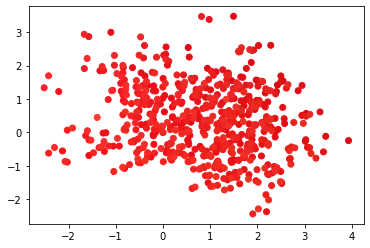

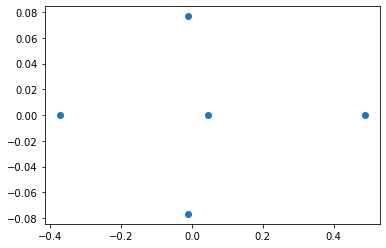

percent error [ -1.49491229  -0.45232483  -4.8203386   -8.13177653 103.35736356]
this [ 6.53653185e+00 -7.75408310e-01 -4.70865070e-01  1.49733693e-01
  9.67279279e-04]
orig [ 6.44025568 -0.77191674 -0.44921155  0.13847335 -0.02881068]


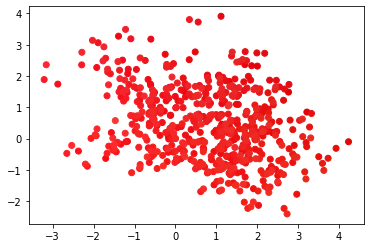

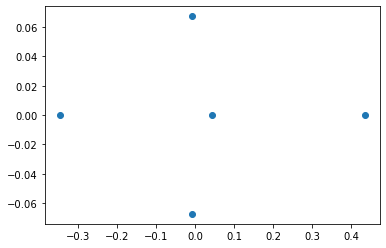

percent error [-12.89461452   4.00239979  -2.38882448 -32.99552799 -14.27470029]
this [ 7.61208773 -0.6995187  -0.62280375  0.02406066  0.18293673]
orig [ 6.74264912 -0.72868353 -0.60827317  0.01809133  0.16008506]


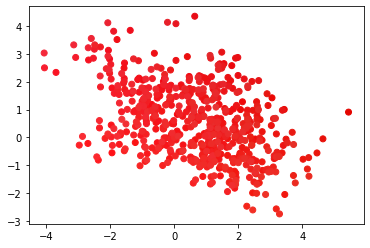

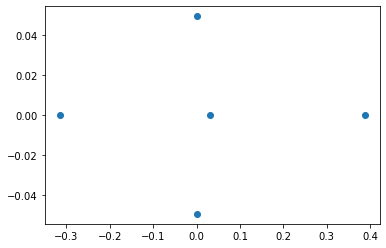

percent error [  7.99373288   2.25239716  -0.89723203 -50.49674629  -1.18734237]
this [ 6.22648931 -0.72669736 -0.38157035  0.06983656  0.27093855]
orig [ 6.76746216 -0.74344264 -0.37817722  0.04640404  0.26775933]


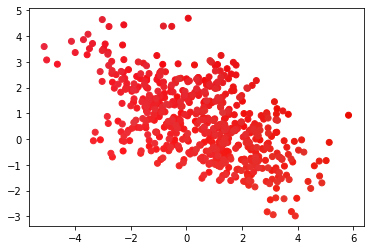

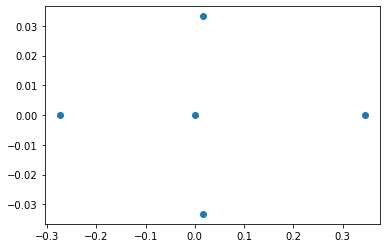

percent error [   7.16298507    2.76205449   -1.83974392 -184.82512686    1.56809096]
this [ 5.88034116 -0.66232675 -0.37370003  0.03845039  0.33952093]
orig [ 6.33404808 -0.68114022 -0.3669491   0.01349965  0.34492974]


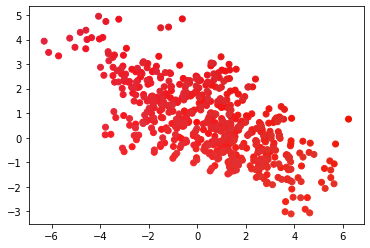

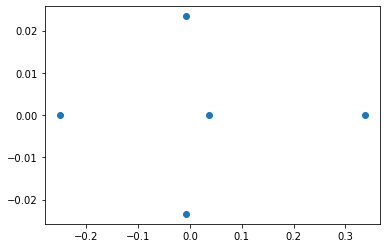

percent error [12.04265283  4.17495028 -0.63691942 80.165591    2.14346023]
this [ 5.01240244e+00 -5.42739720e-01 -3.99883964e-01 -4.83260153e-03
  3.52323756e-01]
orig [ 5.69867396 -0.56638606 -0.39735314 -0.02436474  0.36004109]


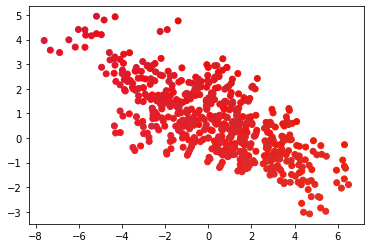

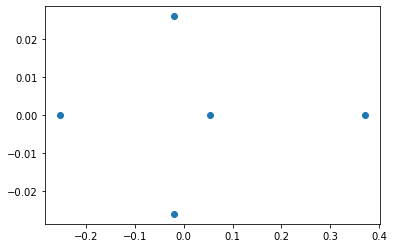

percent error [ -2.88794743   1.81325592  -1.11915362 -66.04576327   5.14333909]
this [ 5.03607693 -0.46532873 -0.44567647  0.05041481  0.33688855]
orig [ 4.89471999 -0.47392215 -0.44074387  0.030362    0.3551554 ]


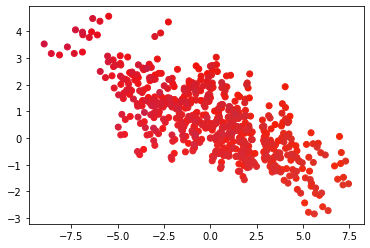

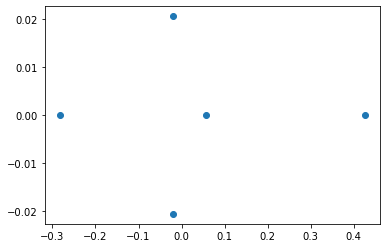

percent error [ -8.78887712   0.24786715   1.73954051 -11.84429823   8.74980994]
this [ 4.51162132 -0.35741469 -0.51202692  0.14153615  0.19488571]
orig [ 4.14713474 -0.3583028  -0.52109151  0.12654749  0.21357293]


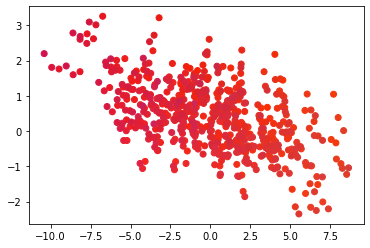

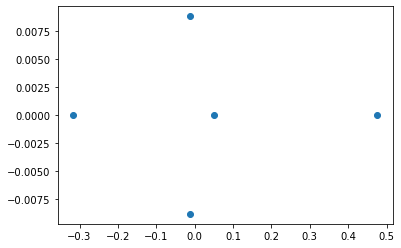

percent error [ 5.00299426e+01 -8.47960015e+00 -5.57950652e-01 -1.06503461e+03
 -4.83211796e-01]
this [ 1.77915783  0.16228895 -0.60186036  0.02733955 -0.41290408]
orig [ 3.56044784e+00  1.49603201e-01 -5.98520908e-01  2.34667296e-03
 -4.10918469e-01]


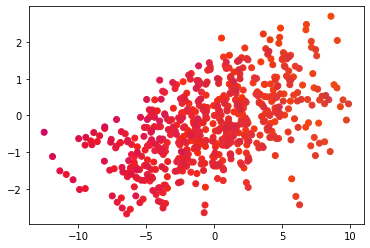

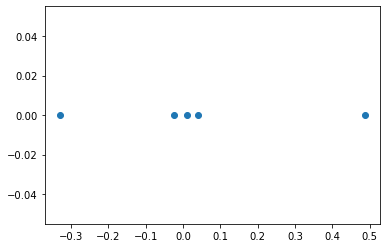

percent error [ 41.5339034    3.11463183 -68.47393073 -17.13105523  -2.61697621]
this [ 1.78697729  0.3963297   0.0672184   0.22906909 -0.98568815]
orig [ 3.05643338  0.40907075  0.0398984   0.19556649 -0.96055076]


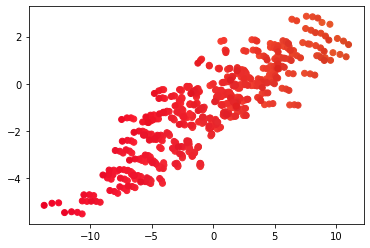

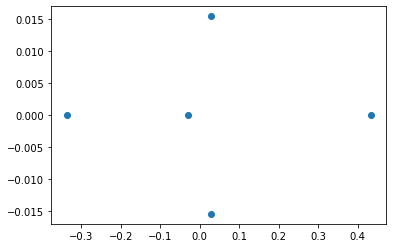

percent error [-13.99727049   7.9327375   -7.93224616 -12.72518682  -2.14875278]
this [ 2.98707714  0.44799657  0.68405509 -0.11836604 -0.69276001]
orig [ 2.62030584  0.48659704  0.63378195 -0.10500407 -0.67818743]


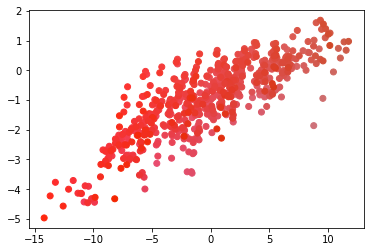

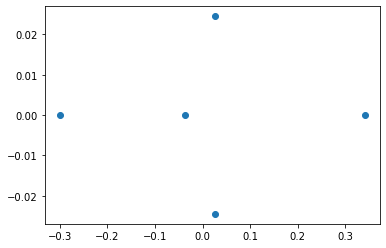

percent error [-2.17881974e+01  1.01438227e+01 -2.36431516e+00  9.18700558e-04
  2.56144377e+00]
this [ 3.04487738  0.45276167  0.97956549 -0.42434236 -0.37881547]
orig [ 2.5001416   0.50387373  0.9569404  -0.42434626 -0.38877369]


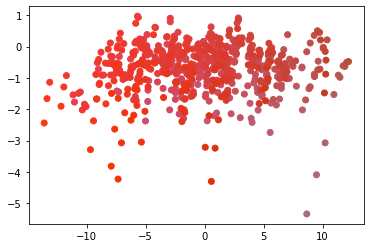

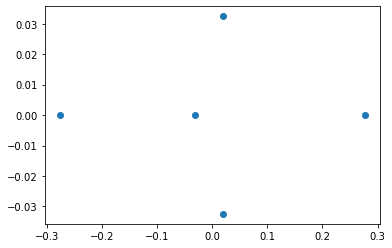

percent error [102.79162816  11.65377952  -1.08754848  -1.6639246   38.45683482]
this [-0.07926141  0.28903349  0.76206109 -0.52526354 -0.05587391]
orig [ 2.83925387  0.32715999  0.75386247 -0.5166666  -0.09078816]


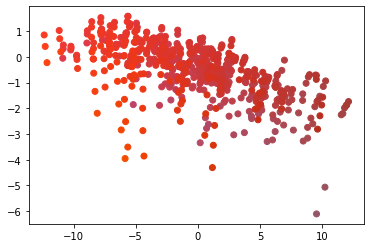

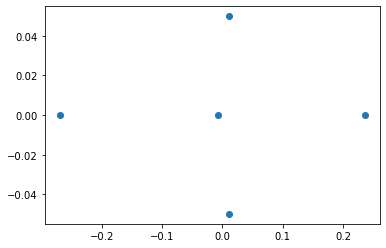

percent error [-2.49633334 54.24682046 -0.85886932 -7.50597529 35.10555034]
this [ 2.60492142  0.13203812  0.69229455 -0.82415681 -0.11494411]
orig [ 2.54147766  0.28858785  0.68639928 -0.76661488 -0.17712472]


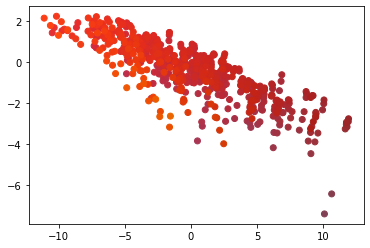

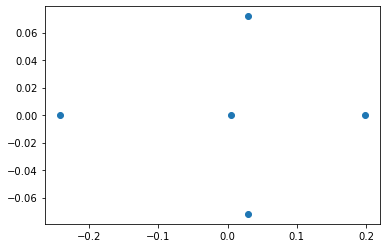

percent error [-54.3708838  151.36205095   6.28473073   4.73112072  13.58673028]
this [ 4.46122496 -0.01555486  0.58939686 -0.69380223  0.05788954]
orig [ 2.88993938  0.03028473  0.62892297 -0.72825694  0.0669915 ]


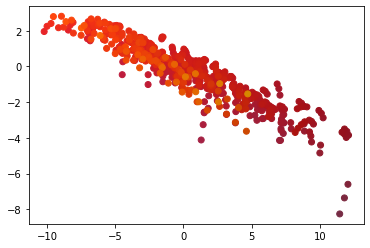

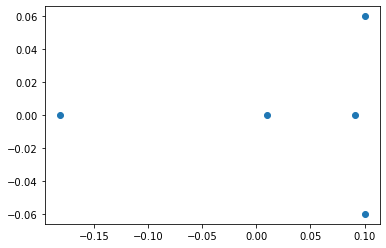

percent error [ -16.14060005  -98.85198056    6.43302223   -1.00194266 -148.25595277]
this [ 3.25472693 -0.4113449   0.48713751 -0.92328319  0.10228847]
orig [ 2.80240237 -0.20685984  0.52062974 -0.91412419  0.04120283]


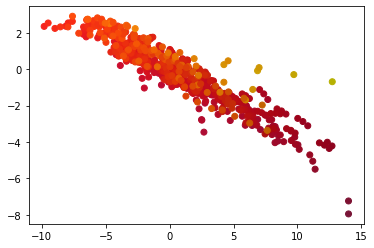

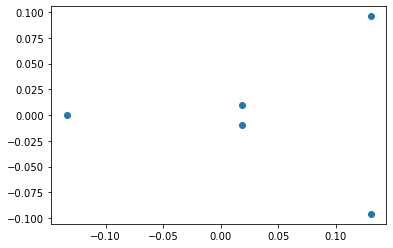

percent error [-24.82337841 -20.98336949  17.46352687  11.32176231  35.44496919]
this [ 4.036733   -0.62208562  0.40729659 -0.67074711  0.20007782]
orig [ 3.23395589 -0.51419102  0.49347468 -0.756383    0.30993374]


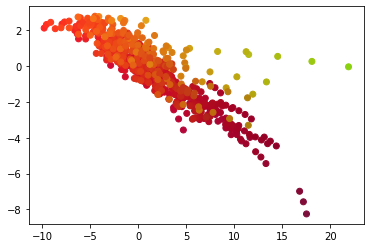

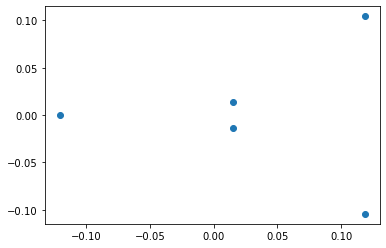

percent error [ 39.16228584 -11.71441423  20.06381447  16.74851664  33.03744571]
this [ 2.25113017 -0.92153134  0.30106023 -0.42729091  0.28629203]
orig [ 3.70022149 -0.82489923  0.37662571 -0.51325321  0.42754049]


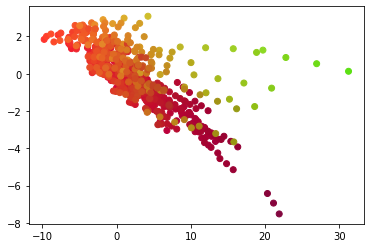

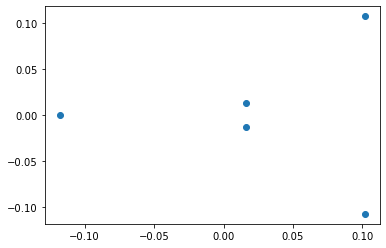

percent error [ 39.71533335  10.63948654 -26.80447718 -43.94660908 155.45224394]
this [ 2.77384244 -0.6700524   0.31066514 -0.11126517 -0.08031555]
orig [ 4.60124041 -0.74983052  0.24499541 -0.07729614  0.14483733]


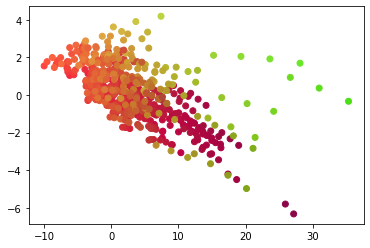

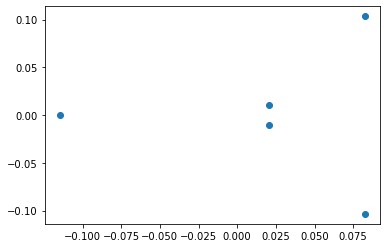

percent error [ 6.25265113 -5.50923144 -3.70486924 33.74593418 54.90591803]
this [ 3.39239799 -1.83247619  0.36454245 -0.10418874  0.17729744]
orig [ 3.61866019 -1.73679228  0.35151913 -0.15725637  0.3931723 ]


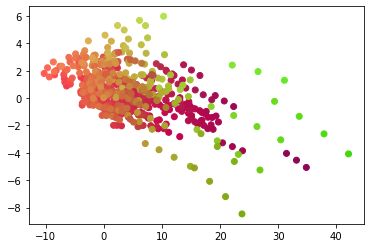

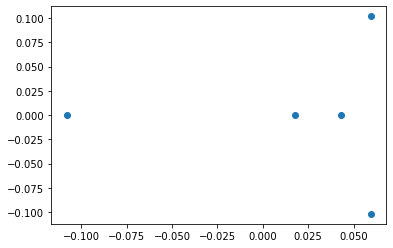

percent error [  -1.73584954   -5.91311283  -10.88611824 -169.62163998  211.5310303 ]
this [ 3.28916064 -2.24633874  0.3890079   0.09219651 -0.12951375]
orig [ 3.23303993 -2.12092599  0.3508175   0.03419477  0.11612351]


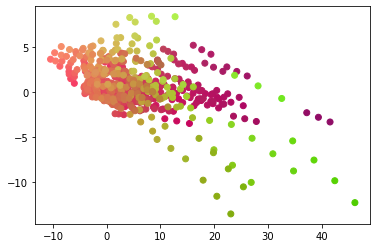

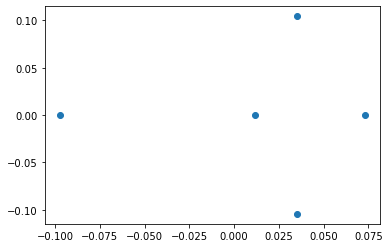

percent error [   9.5597069    -4.21886289  -26.69837784   -2.70883142 -127.96787658]
this [ 2.68734199 -2.51389418  0.7290575   0.05857254 -0.47236979]
orig [ 2.97139903 -2.41212973  0.57542765  0.05702775 -0.20720893]


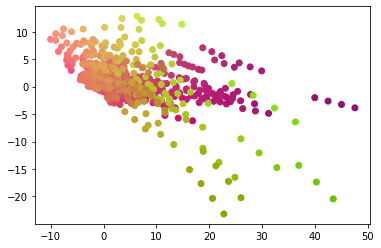

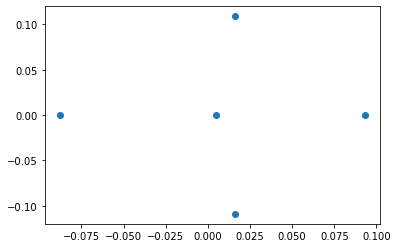

percent error [ 73.45051403   5.29901499  -5.5457452  704.11811173 273.26887645]
this [ 0.99526165 -1.58947139  1.29852054  0.02829645  0.08390279]
orig [ 3.74870404 -1.67841062  1.23029169 -0.00468393 -0.04842346]


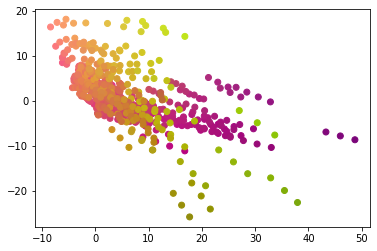

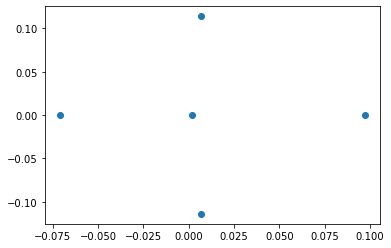

percent error [-1304.09497247   -17.24825477   -64.91722405     7.96464912
   121.00559718]
this [ 7.89688494 -3.17413818  1.69028162  0.60389035 -0.04319687]
orig [ 0.56241815 -2.7071944   1.02492728  0.65615043  0.20564456]


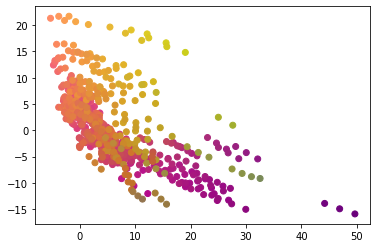

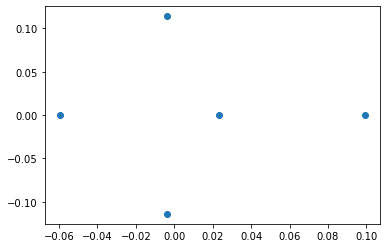

percent error [100.37249389   2.32049198   2.86799982  -6.95156614   8.32277085]
this [-0.0110706  -1.53921102  0.75004638  1.57779938  0.54429195]
orig [ 2.97202158 -1.57577679  0.77219287  1.47524664  0.59370462]


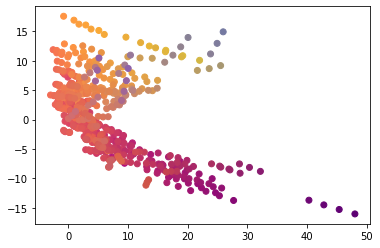

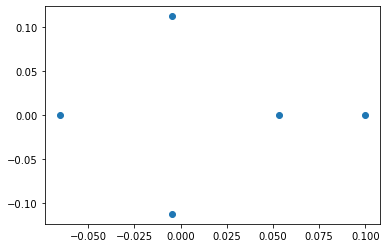

percent error [88.35993594  8.60272997 -6.94834808  8.33519894 20.2224608 ]
this [ 0.45520723 -0.33927047 -0.7945845   1.42689616  0.37734959]
orig [ 3.9106935  -0.37120416 -0.74296099  1.55664567  0.4730023 ]


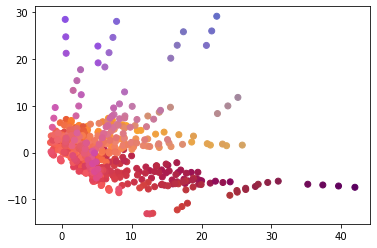

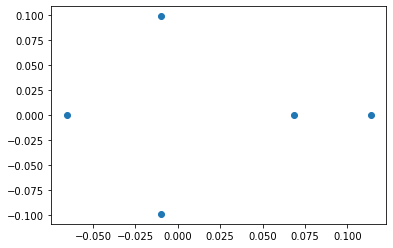

percent error [-1296.09320586    -9.67113104   -97.89214668   -28.03893193
   -35.28091397]
this [ 6.55015612 -2.13969975 -0.86487959  2.49951806 -0.24744997]
orig [ 0.46917757 -1.95101458 -0.43704594  1.95215473 -0.18291566]


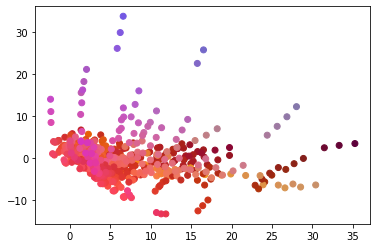

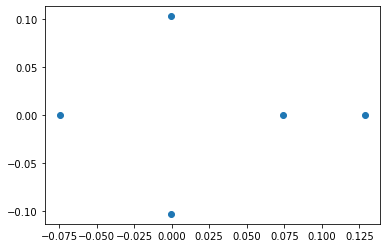

percent error [83.36153861 14.46954476 11.5046864  14.39248061  1.35621195]
this [ 0.63919229 -0.02164939 -1.69058272  0.58566883 -0.52941264]
orig [ 3.84165506 -0.0253119  -1.91036412  0.68413246 -0.53669131]


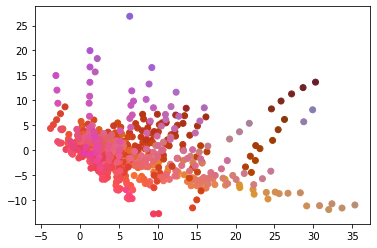

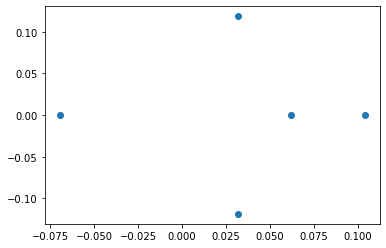

percent error [90.13383112  3.57012768 13.31953294 68.48262008  4.18054955]
this [ 0.40460641  0.11900399 -1.50720827 -0.01913607 -0.78835514]
orig [ 4.10094749  0.12340988 -1.73880959 -0.06071594 -0.82275063]


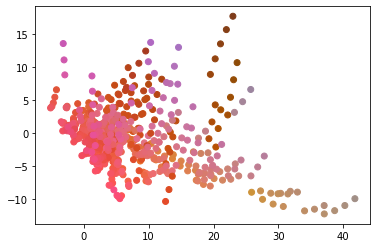

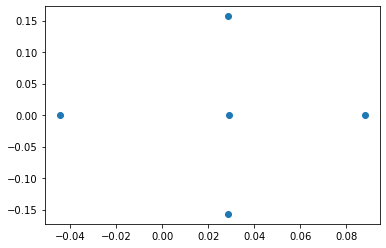

percent error [107.66150018  10.34613707   6.37925043   2.13346773   5.54851046]
this [-0.33304821  0.05900658 -0.8545061  -0.1575553  -0.71331119]
orig [ 4.34703649  0.06581599 -0.91273153 -0.16098997 -0.75521434]


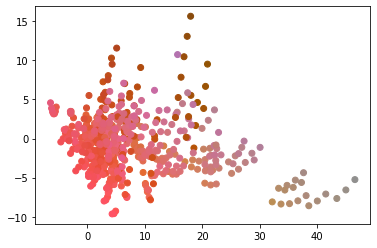

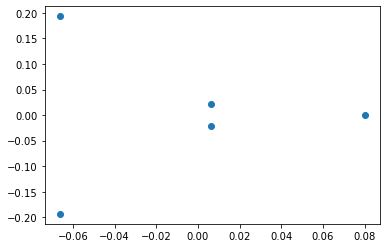

percent error [ 2.15350776  5.79676019  3.75314102 -4.48540392 -1.81439533]
this [ 3.9444544  -0.34723996 -1.66802967 -0.7571739  -1.57531266]
orig [ 4.03126807 -0.36860724 -1.73307439 -0.72466954 -1.54723962]


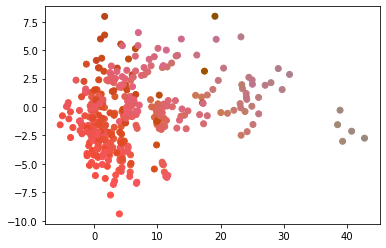

In [56]:
l_frame=3
verify = True
rot = True
points = X

rot_man = utils.rot_keeper(d=N)

frame_centers = points[l_frame//2::l_frame,0,:]
dss = -points[l_frame//2::l_frame,0,:]+points[l_frame//2+1::l_frame,0,:]
numframes = len(frame_centers)
frame_assignment = np.argmin(np.sum((np.expand_dims(np.expand_dims(frame_centers,1),1)-np.expand_dims(points[:-1,1:,:],0))**2,axis=3),axis=0)
for q in range(numframes):
    times,instances = np.where(frame_assignment==q)
    R = rotation_manager.get_rot(dss[q])
    these_pnts = X[times,instances,:] - frame_centers[q]
    if rot: these_pnts = (R @ these_pnts.T).T
    these_dpnts = X[times+1,instances,:]-X[times,instances,:]
    if rot: these_dpnts = (R @ these_dpnts.T).T
    A = normaleq(these_pnts,these_dpnts)
    v,e = np.linalg.eig(A)
    plt.figure()
    plt.scatter(np.real(v),np.imag(v))
    plt.show()
    if verify:
        n = 9 if len(these_pnts) > 9 else -1
        print(f"percent error {100*(these_dpnts[n,:]-these_pnts[n,:]@A)/these_dpnts[n,:]}")
        print(f"this {these_pnts[n,:]@A}")
        print(f"orig {these_dpnts[n,:]}")
        plt.figure()
        plt.scatter(these_pnts[:,1],these_pnts[:,2],c=normalizer(these_dpnts[:,:3]))
        plt.show()

In [108]:
samp = 100
d = 5
X = np.random.randn(samp,d)
A = np.random.randn(5,5)
Y = (X@A)
normaleq = lambda X,Y: np.linalg.inv(X.T@X)@(X.T@Y)
Ae = normaleq(X,Y)
Y[n]-X[n]@Ae

array([-8.88178420e-16,  3.55271368e-15,  2.66453526e-15, -2.66453526e-15,
        0.00000000e+00])

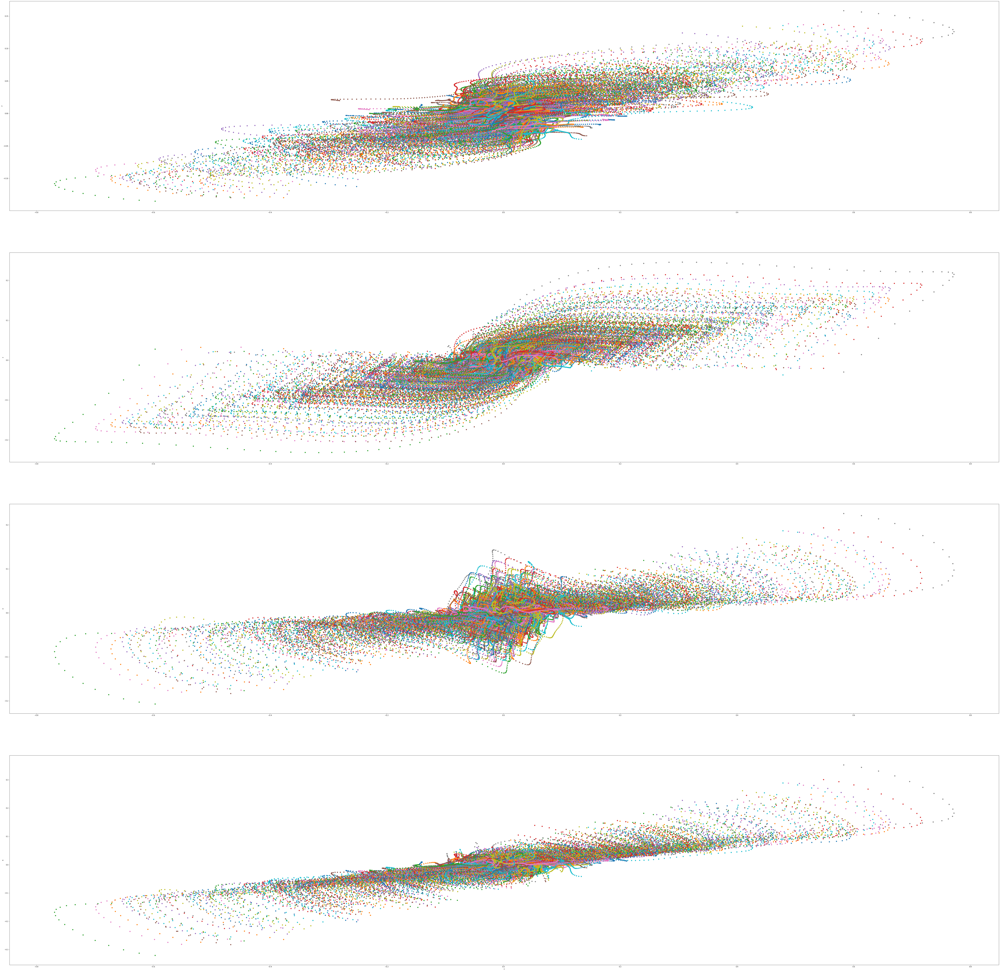

In [8]:
plt5(RX)

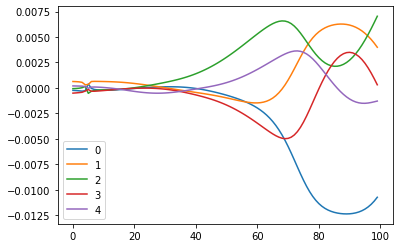

In [61]:
plt.figure()
plt.plot(np.mean(wtf_diff(RX),axis=1))
plt.legend([str(a) for a in range(RX.shape[1])])
plt.show() 

In [62]:
def normal_equation(X,Y):
    #sanity check failed
    try:
        XX = np.linalg.inv(X@X.T)
    except np.linalg.LinAlgError:
        print(f'cant inverse {X@X.T}')
        raise np.linalg.LinAlgError
    return ((XX@X)@Y.T).T
X = np.random.randn(N,500)
B = np.random.randn(N,N)
Y=B@X
B-normal_equation(X,Y)

array([[ 1.09938100e-16, -3.33066907e-16, -4.44089210e-16, -3.33066907e-16,  0.00000000e+00],
       [ 1.11022302e-16, -6.66133815e-16,  2.22044605e-16, -9.02056208e-17, -2.22044605e-16],
       [ 1.11022302e-16,  6.66133815e-16,  2.08166817e-17,  2.22044605e-16, -2.22044605e-16],
       [ 8.88178420e-16, -3.33066907e-16,  4.44089210e-16, -2.77555756e-17, -1.11022302e-16],
       [ 4.44089210e-16,  0.00000000e+00,  0.00000000e+00, -3.33066907e-16,  0.00000000e+00]])

In [63]:
diff = wtf_diff(RX)
Gee = []
for g,d in zip(RX[:,:-1],diff):
    Gee.append(np.linalg.lstsq(g[:,:],d[:,:])[0])
    #Gee.append(normal_equation(g[:,:].T,100*d[:,:].T))


C:\Users\water\AppData\Local\Temp/ipykernel_17812/4084115409.py:4: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  Gee.append(np.linalg.lstsq(g[:,:],d[:,:])[0])


In [73]:
np.diag(Gee[-2]-Gee[-1])

array([ 0.0451451 , -0.21069998, -0.92238701,  0.13220436,  0.38874364])

In [87]:
n=30                        ``
print(Gee[n]-Gee[n-1])
print(Gee[n][0,:])
np.diag(Gee[n-1])

[[ 0.00027585  0.00160585  0.00031914  0.00069678  0.00266198]
 [ 0.00815672 -0.00402198  0.01087682 -0.01017759  0.0048533 ]
 [-0.01353434  0.01485953 -0.01604668  0.00981754  0.00991756]
 [-0.00135068  0.00686395  0.00589819 -0.01936874 -0.00319646]
 [ 0.00880687 -0.00625967  0.00554957  0.00328851 -0.00092863]]
[-0.18133244  0.00381837 -0.02683948  0.0890951  -0.01057399]


array([-0.18160829, -0.20235437, -0.07648542, -0.54505349, -0.20431282])

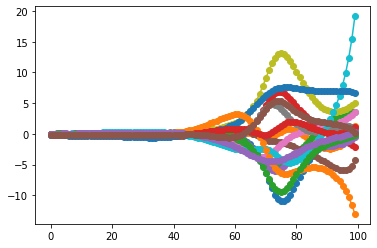

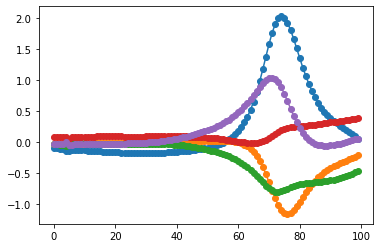

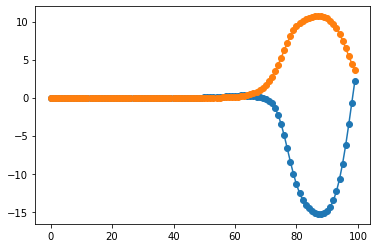

In [90]:
plt.figure()
plt.plot(np.stack([G[1:,1:].flatten() for G in Gee],axis=1).T,'o-')
plt.show()
plt.figure()
plt.plot(np.stack([G[0].flatten() for G in Gee],axis=1).T,'o-')
plt.show()
plt.figure()
plt.plot([np.linalg.det(G[1:,1:]) for G in Gee],'o-')
plt.plot([np.linalg.det(G[:,:]) for G in Gee],'o-')
plt.show()


In [67]:
Gee[99]

array([[  0.04406724,  -0.21459392,  -0.46180564,   0.3852705 ,   0.05245235],
       [ -7.57955903,   0.69026212,   1.35250304,   3.55231125,  -2.12316347],
       [  1.55301667,  -0.46203973,  -4.31281214,   3.55591579,   0.82876033],
       [-41.0063066 ,   4.97397875,  19.14780238,   6.68157797, -13.03321978],
       [  0.21254603,  -0.15093128,   1.19356204,   0.27174681,   0.19022012]])

In [68]:
np.mean(JX[99],axis=0)

array([[-28.8369667 ,  50.34789512, -18.27226895, -16.09203875,  18.99484014],
       [ -5.54975674,   1.20262258, -64.41611929,  20.72438155,   6.75603219],
       [  5.60549288,  45.64927525,   9.27652296,  20.53497626,  36.94386445],
       [-61.75517278, -79.13414028, -20.723577  ,  -7.71058006,  44.42462081],
       [-45.21835259,  -0.4694134 , -71.24074236, -49.66318955,  21.0684012 ]])

In [57]:
np.set_printoptions(linewidth=320)

In [226]:
def wtf_diff(X):
    out = np.zeros_like(X)
    for i in range(X.shape[0]-1):
        out[i] = X[i+1]-X[i]
    return out

In [12]:
def norm(x):
    return np.sqrt(np.sum(x**2))
def normalize(x):
    mag = norm(x)
    return x / mag
def rk_iter(dt,f,Df,Phi,state):()
    k1=dt*Df(Phi,state)
    k2=dt*Df(Phi+k1/2,state)
    k3=dt*Df(Phi+k2/2,state)
    k4=dt*Df(Phi+k3,state)
    Phi=Phi+k1/6+k2/3+k3/3+k4/6

    k1=dt*f(state)
    k2=dt*f(state+k1/2)
    k3=dt*f(state+k2/2)
    k4=dt*f(state+k3)
    state=state+k1/6+k2/3+k3/3+k4/6
    return Phi, state
def rk_iter_nophi(dt,f,Df,state):
    k1=dt*f(state)
    k2=dt*f(state+k1/2)
    k3=dt*f(state+k2/2)
    k4=dt*f(state+k3)
    state=state+k1/6+k2/3+k3/3+k4/6
    return state

def couple_o_steps(f,Df,x0,DT,substeps,couple=10):
    state = x0
    for i in range(couple):
        dt = DT/substeps
        for j in range(substeps):
            state = rk_iter_nophi(dt,f,Df,state) #mostly just using this for the state, so ignoring the phi. 
    return state


def just_integrate(T,f,Df,x0,DT,substeps,transient=0,shorttime=1000):
    def step(state):
        delta_state = state
        for j in range(substeps):
            state = rk_iter_nophi(dt,f,Df,state)
        delta_state = state-delta_state
        return state, delta_state
    dt = DT/substeps
    state = x0
    n=len(x0)
    X = np.zeros((T,n))
    for i in range(T+transient):
        state, ds = step(state)
        X[i] = state
    return X


def local_CLLV(T,f,Df,x0,DT,substeps,transient=1,shorttime=1000,init_spread=1):
    
    def step(state,Phi):
        delta_state = state
        for j in range(substeps):
            Phi,state = rk_iter(dt,f,Df,Phi,state)
        delta_state = state-delta_state
        return state, Phi, delta_state

    #initializing variables    
    dt = DT/substeps
    state = x0
    n=len(x0)
    X = np.zeros((T,n))
    Phi = np.eye(n)
    allPhi = np.zeros((T,n,n))
    allGecobian = np.zeros((T,n-1,n-1))
    allExpansionRates = np.zeros((T,n))
    allExpansionRatesG = np.zeros((T,n-1))
    LyapExp = np.zeros((n-1,))

    shortTimeLyap = np.zeros((T+shorttime-1,n-1))
    allBasis = np.zeros((T+transient,n,n))
    allRs = np.zeros((T+transient,n,n))
    allRgs = np.zeros((T+transient,n-1,n-1))
    allRots = np.zeros((T+transient,n,n))
    allBasis_g = np.zeros((T+transient,n-1,n-1))
    allOmega = np.zeros((T+transient,n))

    rotation_manager = utils.rot_keeper(d=3)

    sigmas = init_spread*np.eye(n-1)

    # get some inital values in 1 step

    """
    state, Phi, ds = step(state,Phi)
    print(Phi)
    R = rotation_manager.get_rot(ds)

    Rhi = R@Phi
    Fhi = Rhi[0,:]
    G = Rhi[1:,1:]

    #LyapExp = (np.log(np.abs(rd))+LyapExp); #changed statement because i is zero indexed now   
    basis_g = G
    basis_g,r_g = np.linalg.qr(basis_g,'complete')
    rd_g = np.diag(r_g)
    basis_g = basis_g@np.diag(np.sign(rd_g))
    rd_g = np.abs(rd_g)
    G = basis_g
    Phi[1:,1:] = G
    Phi = R.T@Phi
    """
    
    for i in range(T+transient):

        state, Phi, ds = step(state,Phi)

        allRots[i] = rotation_manager.get_rot(ds)

        Phi = allRots[i]@Phi
        allOmega[i,:] = Phi[0,:]/ds
        G = Phi[1:,1:]

        basis_g = G
        basis_g,r_g = np.linalg.qr(basis_g,'complete')
        rd_g = np.diag(r_g)
        basis_g = basis_g@np.diag(np.sign(rd_g))
        r_g = np.diag(np.sign(rd_g))@r_g
        LyapExp = (np.log(np.diag(r_g))+LyapExp*i)/(1+i)
        G = basis_g
        
        Phi[1:,1:] = G
        Phi = R.T@Phi

        if i<=T-1:
            X[i,:] = state
            #allJacobian[i,:,:] = Phi@np.linalg.inv(basis) #replaces Phi/basis
            allGecobian[i,:,:] = G@np.linalg.inv(basis_g) #replaces Phi/basis

        allRgs[i,:,:] = r_g
        allBasis_g[i,:,:] = basis_g

        

        if (i<T+shorttime-1):
            shortTimeLyap[i,:] = np.log(np.diag(r_g))

    shortTimeLyap[0:(T),:] = np.apply_along_axis(lambda m: np.convolve(m, np.ones(shorttime)/shorttime, mode='valid'), 
                                                    axis=0, arr=shortTimeLyap)
    shortTimeLyap = shortTimeLyap[:T,:]/DT

    coeff = np.triu(np.random.rand(n,n))
    coeff_g = np.triu(np.random.rand(n-1,n-1))
    for jj in range(n):
        coeff[:,jj] = normalize(coeff[:,jj])
    for jj in range(n-1):
        coeff_g[:,jj] = normalize(coeff_g[:,jj])

    for i in range(T+transient-1,0,-1):
        #coeff = np.linalg.solve(np.squeeze(allRs[i,:,:]),coeff); # same as squeeze(allRs(i,:,:))\coeff;
        #coeff = np.triu(coeff)
        coeff_g = np.linalg.solve(np.squeeze(allRgs[i,:,:]),coeff_g); # same as squeeze(allRs(i,:,:))\coeff;
        coeff_g = np.triu(coeff_g)

        #for jj in range(n):
            #if (i<=T-1):
                #allExpansionRates[i,jj] = 1/norm(coeff[:,jj]) # ./ -> /
            #coeff[:,jj] = normalize(coeff[:,jj])
        for jj in range(n-1):
            if (i<=T-1):
                allExpansionRatesG[i,jj] = 1/norm(coeff_g[:,jj]) # ./ -> /
            coeff_g[:,jj] = normalize(coeff_g[:,jj])

        #allBasis[i,:,:] = np.squeeze(allBasis[i,:,:])@coeff
        allBasis_g[i,:,:] = np.squeeze(allBasis_g[i,:,:])@coeff_g

        #for jj in range(n):
        #    allBasis[i,:,jj] = normalize(allBasis[i,:,jj])
        for jj in range(n-1):
            allBasis_g[i,:,jj] = normalize(allBasis_g[i,:,jj])

    #allBasis = allBasis[:T,:,:]
    allBasis_g = allBasis_g[:T,:,:]

    return X, allBasis_g, allRgs, allJacobian, allGecobian, allExpansionRatesG, shortTimeLyap, allRots, LyapExp
class rot_keeper(object):
    def __init__(self,d=3):
        assert(d>2)
        self.d=d
        self.e1 = np.zeros(d)
        self.e1[0]=1.0
        self.e1_sm = np.zeros(d-1)
        self.e1_sm[0]=1.0
        self.e2 = np.zeros(d)
        self.e2[1]=1.0
        self.R = np.eye(d)

    def get_rot(self,u):
        Rs = utils.rot_mat(u,self.e1)
        e2old = self.R.T@self.e2
        Rpp = np.eye(self.d)
        Rpp[1:,1:] = utils.rot_mat((Rs@e2old)[1:],self.e1_sm)
        Rs = Rpp @ Rs
        self.R = Rs
        return Rs
def local_region(T,f,Jf,x0,DT,substeps,init_spread=1):
    
    def step(state):
        for j in range(substeps):
            state = rk_iter_nophi(dt,f,Jf,state)
        return state, Jf(state), f(state)

    #initializing variables    
    dt = DT/substeps
    state = x0
    n=len(x0)
    X = np.zeros((T,n))
    Phi = np.eye(n)
    allPhi = np.zeros((T,n,n))
    rotation_manager = rot_keeper(d=3)
    allRots = np.zeros((T,n,n))
    allG = np.zeros((T,n-1,n-1))
    allOmega = np.zeros((T,n))
    allDs = np.zeros((T,n))

    sigmas = init_spread*np.eye(n-1)

    # get some inital values in 1 step

    """
    state, Phi, ds = step(state,Phi)
    print(Phi)
    R = rotation_manager.get_rot(ds)

    Rhi = R@Phi
    Fhi = Rhi[0,:]
    G = Rhi[1:,1:]

    #LyapExp = (np.log(np.abs(rd))+LyapExp); #changed statement because i is zero indexed now   
    basis_g = G
    basis_g,r_g = np.linalg.qr(basis_g,'complete')
    rd_g = np.diag(r_g)
    basis_g = basis_g@np.diag(np.sign(rd_g))
    rd_g = np.abs(rd_g)
    G = basis_g
    Phi[1:,1:] = G
    Phi = R.T@Phi
    """
    
    for i in range(T):

        state, Phi, ds = step(state)
        allDs[i] = ds
        X[i] = state

        allRots[i] = rotation_manager.get_rot(ds)
        print(Phi)
        Phi = allRots[i]@Phi
        print(Phi)
        allOmega[i,:] = Phi[0,:]#/np.sqrt(np.sum(ds**2))
        G = Phi[1:,1:]
        print(allOmega[i,:])
        print(G)

        allG[i,:,:] = G
        

    return X, allG, allOmega, allRots, allDs


In [ ]:
T = 50;
DT=0.01;
substeps=2;
x0 = pnts[:,0]
lborentz = lambda x:borentz(0,x)
X, allG, allOmega, allRots, allDs = local_region(T,aa,Jaa,x0,DT,substeps)
plt3(X)
plt.figure()
for i,G in enumerate(allG):
    plt.scatter(G[:,0],G[:,1],c=[0,1])
plt.show()

In [ ]:
def plt3(x):
    plt.figure()
    plt.subplot(2,1,1)
    plt.scatter(x[:,0],x[:,1],c='r')
    plt.ylabel('y')
    plt.subplot(2,1,2)
    plt.scatter(x[:,0],x[:,2],c='r')
    plt.ylabel('z')
    plt.xlabel('x')
    plt.show()
def scat_and_dist(x,y,fig=None):
    from matplotlib.gridspec import GridSpec

    if fig is None:
        fig = plt.figure()
    gs = GridSpec(4, 4)

    ax_scatter = fig.add_subplot(gs[1:4, 0:3])
    ax_hist_x = fig.add_subplot(gs[0,0:3])
    ax_hist_y = fig.add_subplot(gs[1:4, 3])

    ax_scatter.scatter(x,y)
    ax_scatter.axis('equal')

    ax_hist_x.hist(x)
    ax_hist_y.hist(y, orientation = 'horizontal')

    plt.show()

In [314]:
def borentz(t,x, sigma = 10, rho = 28, beta = 8/3):
    dx = np.zeros((3,))
    dx[0] =  (x[1] - x[0])
    dx[1] = - x[2] - x[1]
    dx[2] = x[0]  - beta * x[2]
    return dx
def Jborentz(x, sigma = 10, rho = 28, beta = 8/3):
    J=[[-1,    1,       0],
       [0,     -1,   -1],
       [1,          0, -beta]]
    return np.array(J)


def aa(x, sigma = 10, rho = 28, beta = 8/3):
    dx = np.zeros((3,))
    dx[0] =  - x[0]
    dx[1] =  - x[1]
    dx[2] =  - x[2]
    return dx
def Jaa(x, sigma = 10, rho = 28, beta = 8/3):
    J=- np.eye(3)
    return np.array(J)


[[-1. -0. -0.]
 [-0. -1. -0.]
 [-0. -0. -1.]]
[[ 5.77350269e-01  5.77350269e-01  5.77350269e-01]
 [ 4.08248290e-01 -8.16496581e-01  4.08248290e-01]
 [ 7.07106781e-01 -4.03199798e-17 -7.07106781e-01]]
[0.57735027 0.57735027 0.57735027]
[[-8.16496581e-01  4.08248290e-01]
 [-4.03199798e-17 -7.07106781e-01]]
[[-1. -0. -0.]
 [-0. -1. -0.]
 [-0. -0. -1.]]
[[ 5.77350269e-01  5.77350269e-01  5.77350269e-01]
 [ 4.08248290e-01 -8.16496581e-01  4.08248290e-01]
 [ 7.07106781e-01 -1.59929887e-16 -7.07106781e-01]]
[0.57735027 0.57735027 0.57735027]
[[-8.16496581e-01  4.08248290e-01]
 [-1.59929887e-16 -7.07106781e-01]]
[[-1. -0. -0.]
 [-0. -1. -0.]
 [-0. -0. -1.]]
[[ 5.77350269e-01  5.77350269e-01  5.77350269e-01]
 [ 4.08248290e-01 -8.16496581e-01  4.08248290e-01]
 [ 7.07106781e-01 -3.90562097e-16 -7.07106781e-01]]
[0.57735027 0.57735027 0.57735027]
[[-8.16496581e-01  4.08248290e-01]
 [-3.90562097e-16 -7.07106781e-01]]
[[-1. -0. -0.]
 [-0. -1. -0.]
 [-0. -0. -1.]]
[[ 5.77350269e-01  5.77350269e-01  5

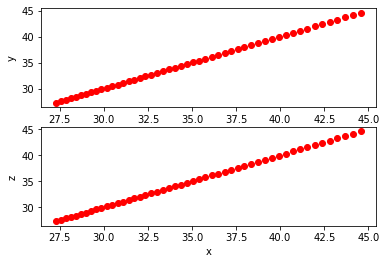

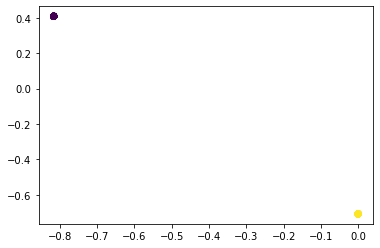

In [317]:
T = 50;
DT=0.01;
substeps=2;
x0 = 45*np.ones((3,))# pnts[:,0]
lborentz = lambda x:borentz(0,x)
X, allG, allOmega, allRots, allDs = local_region(T,aa,Jaa,x0,DT,substeps)
plt3(X)
plt.figure()
for i,G in enumerate(allG):
    plt.scatter(G[:,0],G[:,1],c=[0,1])
plt.show()

In [323]:
R@np.array([1,1,1])

array([-0.51406411,  1.63956866, -0.2180658 ])

In [318]:
paths = []
deltax = []
npaths = 100
spread = 0.1
for n in range(npaths):
    deltax.append(np.random.randn(3,)*spread)
    paths.append(just_integrate(T,aa,Jaa,x0+deltax[-1],DT,substeps,transient=0,shorttime=5))


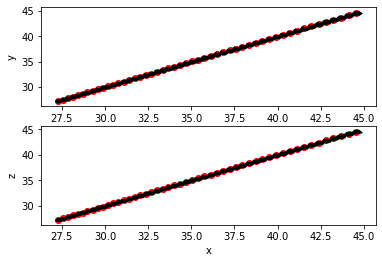

In [319]:
plt.figure()
plt.subplot(2,1,1)
plt.scatter(X[:,0],X[:,1],c='r')
for p in paths:
    plt.scatter(p[:,0],p[:,1],c='k',s=1)
plt.ylabel('y')
plt.subplot(2,1,2)
plt.scatter(X[:,0],X[:,2],c='r')
for p in paths:
    plt.scatter(p[:,0],p[:,2],c='k',s=1)
plt.ylabel('z')
plt.xlabel('x')
plt.show()

[[-0.99922569 -0.0393448 ]
 [ 0.0393448  -0.99922569]]


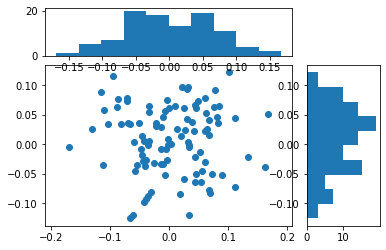

gx 0.0644
gy 0.0564
w 0.0623


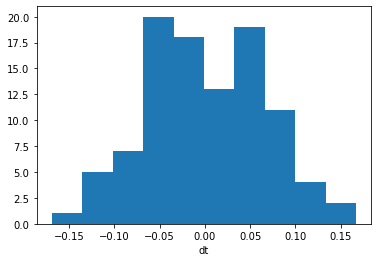

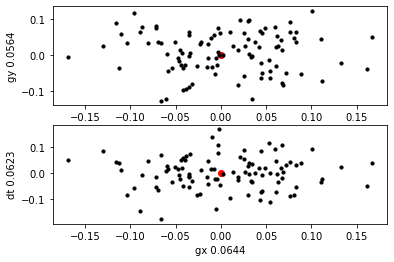

In [320]:
#rotated
at = -1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-allRots[at]@p[at,:])

ph = np.stack(ph)
_,_,rr = np.linalg.svd(ph[:,1:])
print(rr)
ph[:,1:] = (rr@ph[:,1:].T).T

scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
print(f'w {np.std([p[0] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

In [321]:
s = spread*np.ones(2)
for G in allG:
    f = lambda q: G@q
    dF = lambda q:q
    s = couple_o_steps(f,dF,s,DT,substeps,couple=1)
s

array([0.08042981, 0.07021885])

In [309]:
G

array([[-8.16496581e-01,  4.08248290e-01],
       [-1.94382614e-15, -7.07106781e-01]])

In [245]:
t = spread*np.ones(3)
for g,w in zip(allG,allOmega):
    f = lambda q: w.T@q
    dF = lambda q:q
    print(a)
    a = couple_o_steps(f,dF,a,DT,substeps,couple=1)
a

[0.1 0.1]
[0.09815472 0.09739372]
[0.0963499  0.09484674]
[0.09458471 0.09235834]
[0.09285835 0.08992777]
[0.09116999 0.08755423]
[0.08951883 0.08523691]
[0.08790407 0.08297496]
[0.0863249  0.08076753]
[0.08478055 0.0786137 ]
[0.08327023 0.07651259]
[0.08179317 0.07446326]
[0.08034861 0.07246478]
[0.0789358 0.0705162]
[0.077554   0.06861657]
[0.07620249 0.06676493]
[0.07488055 0.06496031]
[0.07358748 0.06320176]
[0.07232259 0.06148829]
[0.07108521 0.05981896]
[0.06987467 0.0581928 ]
[0.06869032 0.05660886]
[0.06753153 0.05506619]
[0.06639769 0.05356385]
[0.06528817 0.05210091]
[0.0642024  0.05067645]
[0.06313978 0.04928956]
[0.06209976 0.04793934]
[0.06108178 0.0466249 ]
[0.06008531 0.04534538]
[0.05910981 0.0440999 ]
[0.05815477 0.04288763]
[0.05721971 0.04170773]
[0.05630412 0.04055939]
[0.05540754 0.0394418 ]
[0.0545295  0.03835419]
[0.05366956 0.03729577]
[0.05282728 0.03626579]
[0.05200223 0.03526352]
[0.051194   0.03428823]
[0.05040219 0.03333922]
[0.04962639 0.03241579]
[0.04886

array([0.04330561, 0.02514958])

In [230]:
def couple_o_steps(f,Df,x0,DT,substeps,couple=10):
    state = x0
    for i in range(couple):
        dt = DT/substeps
        for j in range(substeps):
            state = rk_iter_nophi(dt,f,Df,state) #mostly just using this for the state, so ignoring the phi. 
    return state

array([[[-9.98987577e-01, -1.11082698e+00],
        [ 2.40764121e-15, -9.64727338e-01]],

       [[-9.98495798e-01, -1.13476467e+00],
        [ 1.73287397e-04, -9.74113318e-01]],

       [[-9.97901549e-01, -1.15876161e+00],
        [ 3.80379949e-04, -9.83261211e-01]],

       [[-9.97202466e-01, -1.18280873e+00],
        [ 6.19955271e-04, -9.92166805e-01]],

       [[-9.96396238e-01, -1.20689688e+00],
        [ 8.90599612e-04, -1.00082615e+00]],

       [[-9.95480615e-01, -1.23101685e+00],
        [ 1.19080908e-03, -1.00923556e+00]],

       [[-9.94453408e-01, -1.25515936e+00],
        [ 1.51899110e-03, -1.01739161e+00]],

       [[-9.93312497e-01, -1.27931511e+00],
        [ 1.87346610e-03, -1.02529119e+00]],

       [[-9.92055828e-01, -1.30347475e+00],
        [ 2.25246946e-03, -1.03293144e+00]],

       [[-9.90681422e-01, -1.32762893e+00],
        [ 2.65415364e-03, -1.04030981e+00]],

       [[-9.89187374e-01, -1.35176828e+00],
        [ 3.07659060e-03, -1.04742404e+00]],

       [[-

In [197]:
np.sqrt(np.sum((x[-1]-x[-2])**2))

0.009960178975268831

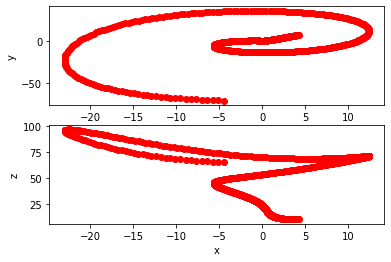

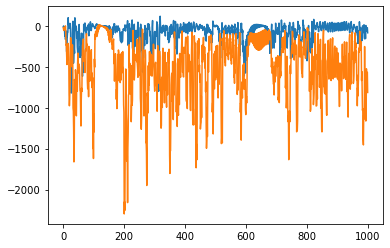

In [88]:
T = 1000;
DT=0.001;
substeps=2;
x0 = pnts[:,0]
llorentz = lambda x: lorentz(0,x)
X, allBasisG, allRGs, allJacobian,allGecobian,allExpansionRatesG,shortTimeLyap, allRots, LyapExp = local_CLLV(T,llorentz,Dlorentz,x0,DT,substeps,transient=22,shorttime=5)
plt3(X)
plt.figure()
plt.plot(shortTimeLyap)
plt.show()

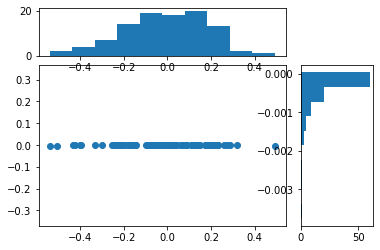

gx 0.1923
gy 0.0006
w 0.5572


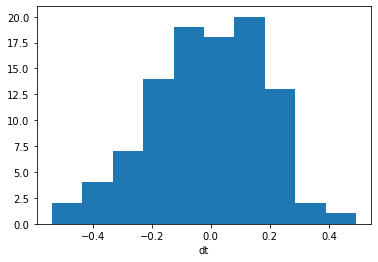

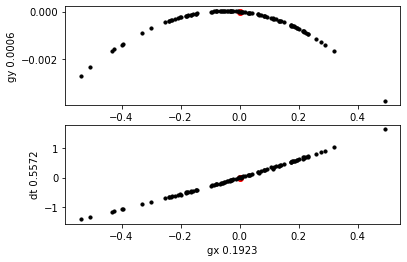

In [ ]:
#rotated
at = -1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-allRots[at]@p[at,:])

ph = np.stack(ph)
_,_,rr = np.linalg.svd(ph[:,1:])

ph[:,1:] = (rr@ph[:,1:].T).T

scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
print(f'w {np.std([p[0] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

In [71]:
Gtot = np.eye(2)
for G in allGecobian:
    Gtot=G@Gtot
Gtot

array([[ 5.59060179e-37,  2.15171323e-35],
       [-1.90659782e-36, -7.33812191e-35]])

In [73]:
np.exp(LyapExp)*spread

array([0.09242875, 0.05925719])

In [48]:
paths = []
deltax = []
npaths = 100
spread = 0.1
for n in range(npaths):
    deltax.append(np.random.randn(3,)*spread)
    paths.append(just_integrate(T,llorentz,Dlorentz,x0+deltax[-1],DT,substeps,transient=0,shorttime=5))


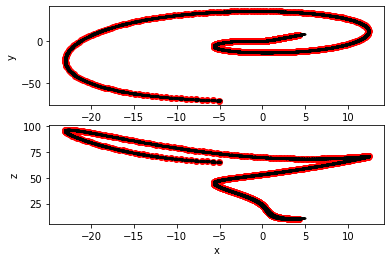

In [49]:
plt.figure()
plt.subplot(2,1,1)
plt.scatter(X[:,0],X[:,1],c='r')
for p in paths:
    plt.scatter(p[:,0],p[:,1],c='k',s=1)
plt.ylabel('y')
plt.subplot(2,1,2)
plt.scatter(X[:,0],X[:,2],c='r')
for p in paths:
    plt.scatter(p[:,0],p[:,2],c='k',s=1)
plt.ylabel('z')
plt.xlabel('x')
plt.show()

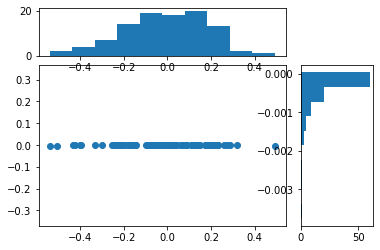

gx 0.1923
gy 0.0006
w 0.5572


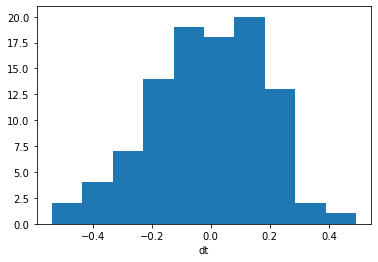

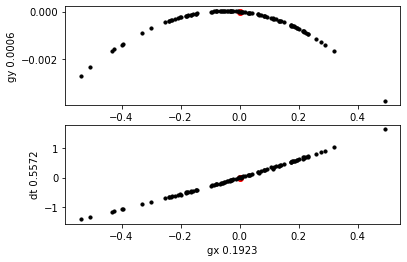

In [74]:
#rotated
at = -1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-allRots[at]@p[at,:])

ph = np.stack(ph)
_,_,rr = np.linalg.svd(ph[:,1:])

ph[:,1:] = (rr@ph[:,1:].T).T

scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
print(f'w {np.std([p[0] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

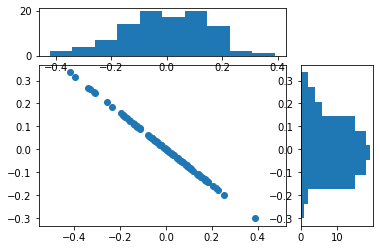

gx 0.1510
gy 0.1191


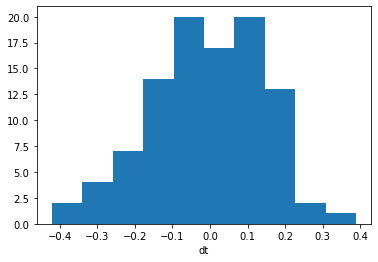

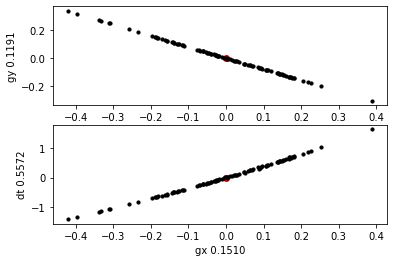

In [ ]:
#rotated
at = -1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-all`Rots[at]@p[at,:])
`
scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

In [16]:
np.linalg.eig?

Signature: np.linalg.eig(a)
Docstring:
Compute the eigenvalues and right eigenvectors of a square array.

Parameters
----------
a : (..., M, M) array
    Matrices for which the eigenvalues and right eigenvectors will
    be computed

Returns
-------
w : (..., M) array
    The eigenvalues, each repeated according to its multiplicity.
    The eigenvalues are not necessarily ordered. The resulting
    array will be of complex type, unless the imaginary part is
    zero in which case it will be cast to a real type. When `a`
    is real the resulting eigenvalues will be real (0 imaginary
    part) or occur in conjugate pairs

v : (..., M, M) array
    The normalized (unit "length") eigenvectors, such that the
    column ``v[:,i]`` is the eigenvector corresponding to the
    eigenvalue ``w[i]``.

Raises
------
LinAlgError
    If the eigenvalue computation does not converge.

See Also
--------
eigvals : eigenvalues of a non-symmetric array.
eigh : eigenvalues and eigenvectors of a real symmet

In [21]:
np.exp(LyapExp)

array([0.72626873, 0.46826548])

In [23]:
0.809*.46

0.37214

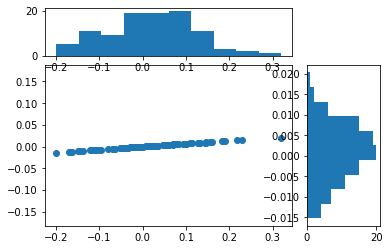

gx 0.0991
gy 0.0069


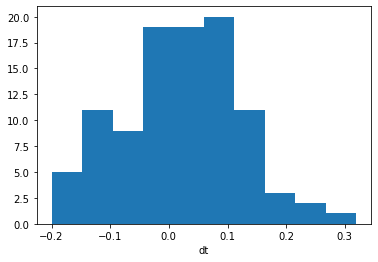

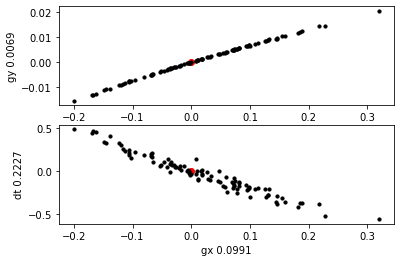

In [18]:
#rotated
at = -1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-allRots[at]@p[at,:])

scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

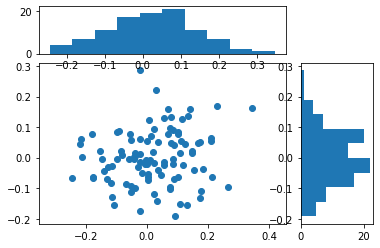

gx 0.1157
gy 0.0890


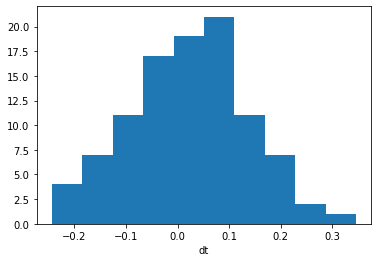

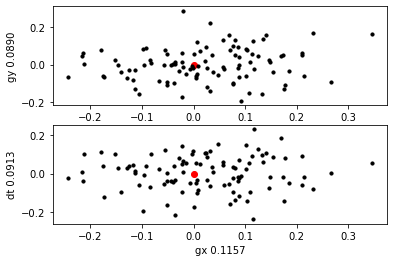

In [19]:
#rotated
at = 1

xh = allRots[at]@X[at,:]
ph = []
for p in paths:
    ph.append(xh-allRots[at]@p[at,:])

scat_and_dist([p[1] for p in ph],[p[2] for p in ph])
print(f'gx {np.std([p[1] for p in ph]):.4f}')
print(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.figure()
plt.hist([p[1] for p in ph])
plt.xlabel('dt')
plt.show()


plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[2],c='k',s=10)
plt.ylabel(f'gy {np.std([p[2] for p in ph]):.4f}')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in ph:
    plt.scatter(p[1],p[0],c='k',s=10)
plt.ylabel(f'dt {np.std([p[0] for p in ph]):.4f}')
plt.xlabel(f'gx {np.std([p[1] for p in ph]):.4f}')
plt.show()

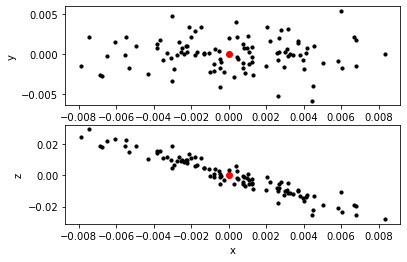

In [98]:
at = -11
plt.figure()
plt.subplot(2,1,1)
plt.scatter(0,0,c='r')
for p in paths:
    plt.scatter(X[at,0]-p[at,0],X[at,1]-p[at,1],c='k',s=10)
plt.ylabel('y')
plt.subplot(2,1,2)
plt.scatter(0,0,c='r')
for p in paths:
    plt.scatter(X[at,0]-p[at,0],X[at,2]-p[at,2],c='k',s=10)
plt.ylabel('z')
plt.xlabel('x')
plt.show()

In [15]:
T = 1000;
DT=0.001;
substeps=2;
x0 = pnts[:,0]
llorentz = lambda x: lorentz(0,x)
f=llorentz
Df=Dlorentz
transient=0
shorttime=5
    
def step(state,Phi):
    delta_state = state
    for j in range(substeps):
        Phi,state = rk_iter(dt,f,Df,Phi,state)
    delta_state = state-delta_state
    return state, Phi, delta_state

#initializing variables    
state = x0
n=len(x0)
X = np.zeros((T,n))
Phi = np.eye(n)
allJacobian = np.zeros((T,n,n))
allGecobian = np.zeros((T,n-1,n-1))
allExpansionRates = np.zeros((T,n))
LyapExp = np.zeros((n-1,))

shortTimeLyap = np.zeros((T+shorttime-1,n-1))
allBasis = np.zeros((T+transient,n,n))
allRs = np.zeros((T+transient,n,n))
allBasis_g = np.zeros((T+transient,n-1,n-1))
allRs_g = np.zeros((T+transient,n-1,n-1))
allOmega = np.zeros((T+transient,n))

rotation_manager = utils.rot_keeper(d=3)

# get some inital values in 1 step
dt = DT/substeps

state, Phi, ds = step(state,Phi)

R = rotation_manager.get_rot(ds)

Phi = R@Phi
Fhi = Phi[0,:]
G = Phi[1:,1:]

basis = Phi
basis,r = np.linalg.qr(basis,'complete')
rd = np.diag(r)
basis = basis@np.diag(np.sign(rd))
rd = np.abs(rd)
Phi = basis
#LyapExp = (np.log(np.abs(rd))+LyapExp); #changed statement because i is zero indexed now   
basis_g = G
basis_g,r_g = np.linalg.qr(basis_g,'complete')
rd_g = np.diag(r_g)
basis_g = basis_g@np.diag(np.sign(rd_g))
rd_g = np.abs(rd_g)
G = basis_g


In [16]:
for i in range(T+transient):

    dt = DT/substeps

    state, Phi, ds = step(state,Phi)

    R = rotation_manager.get_rot(ds)

    Phi = R@Phi
    allOmega[i,:] = Phi[0,:]/ds
    G = Phi[1:,1:]


    if i<=T-1:
        X[i,:] = state
        allJacobian[i,:,:] = Phi@np.linalg.inv(basis) #replaces Phi/basis
        allGecobian[i,:,:] = G@np.linalg.inv(basis_g) #replaces Phi/basis

    basis = Phi
    basis,r = np.linalg.qr(basis,'complete')
    rd = np.diag(r)
    basis = basis@np.diag(np.sign(rd))
    r = np.diag(np.sign(rd))@r
    Phi = basis

    basis_g = G
    basis_g,r_g = np.linalg.qr(basis_g,'complete')
    rd_g = np.diag(r_g)
    basis_g = basis_g@np.diag(np.sign(rd_g))
    r_g = np.diag(np.sign(rd_g))@r_g
    LyapExp = (np.log(np.diag(r_g))+LyapExp*i)/(1+i)
    G = basis_g

    allRs[i,:,:] = r
    allBasis[i,:,:] = basis

    if (i<T+shorttime-1):
        shortTimeLyap[i,:] = np.log(np.diag(r_g))

shortTimeLyap[0:(T),:] = np.apply_along_axis(lambda m: np.convolve(m, np.ones(shorttime)/shorttime, mode='valid'), 
                                                axis=0, arr=shortTimeLyap)
shortTimeLyap = shortTimeLyap[:T,:]/DT

coeff = np.triu(np.random.rand(n,n))
for jj in range(n):
    coeff[:,jj] = normalize(coeff[:,jj])

for i in range(T+transient-1,0,-1):

    coeff = np.linalg.solve(np.squeeze(allRs[i,:,:]),coeff); # same as squeeze(allRs(i,:,:))\coeff;
    coeff = np.triu(coeff)

    for jj in range(n):
        if (i<=T-1):
            allExpansionRates[i,jj] = 1/norm(coeff[:,jj]) # ./ -> /
        coeff[:,jj] = normalize(coeff[:,jj])

    allBasis[i,:,:] = np.squeeze(allBasis[i,:,:])@coeff

    for jj in range(n):
        allBasis[i,:,jj] = normalize(allBasis[i,:,jj])

allBasis = allBasis[:T,:,:]

